In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Memuat file audio: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Bearing/M4/1700.wav
Sample rate: 16000 Hz
Durasi audio: 10.32 detik
Menerapkan filter multi-band...
Total bin frekuensi: 82601
Bin frekuensi yang dipertahankan: 44397
Persentase bin frekuensi yang dipertahankan: 53.75%

Membuat visualisasi...



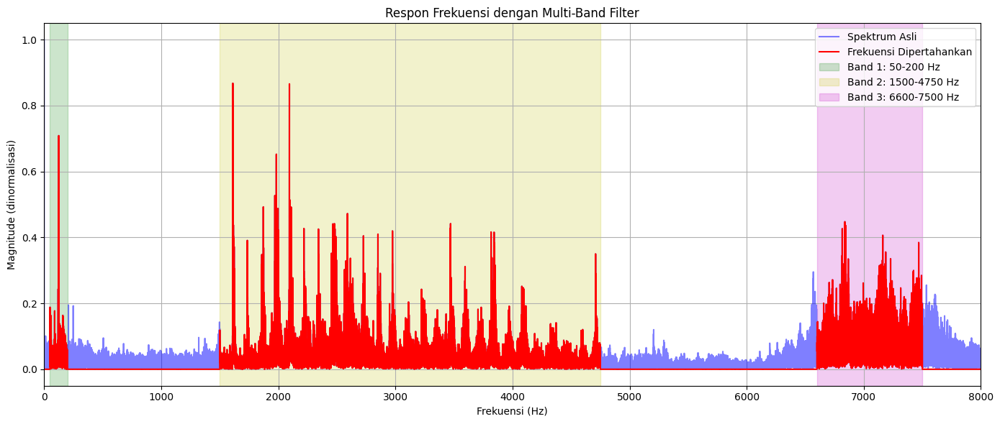

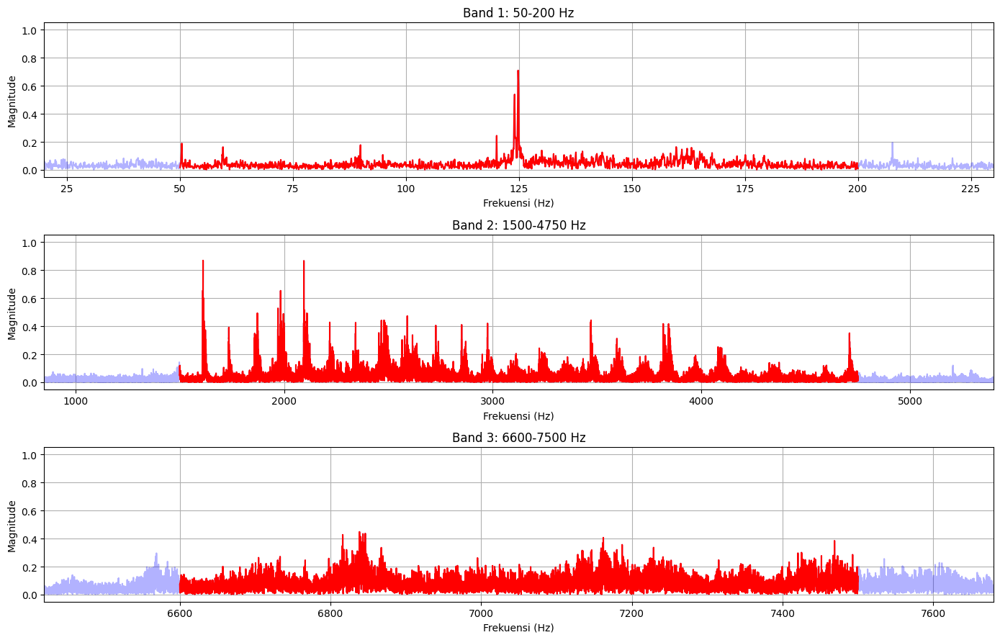

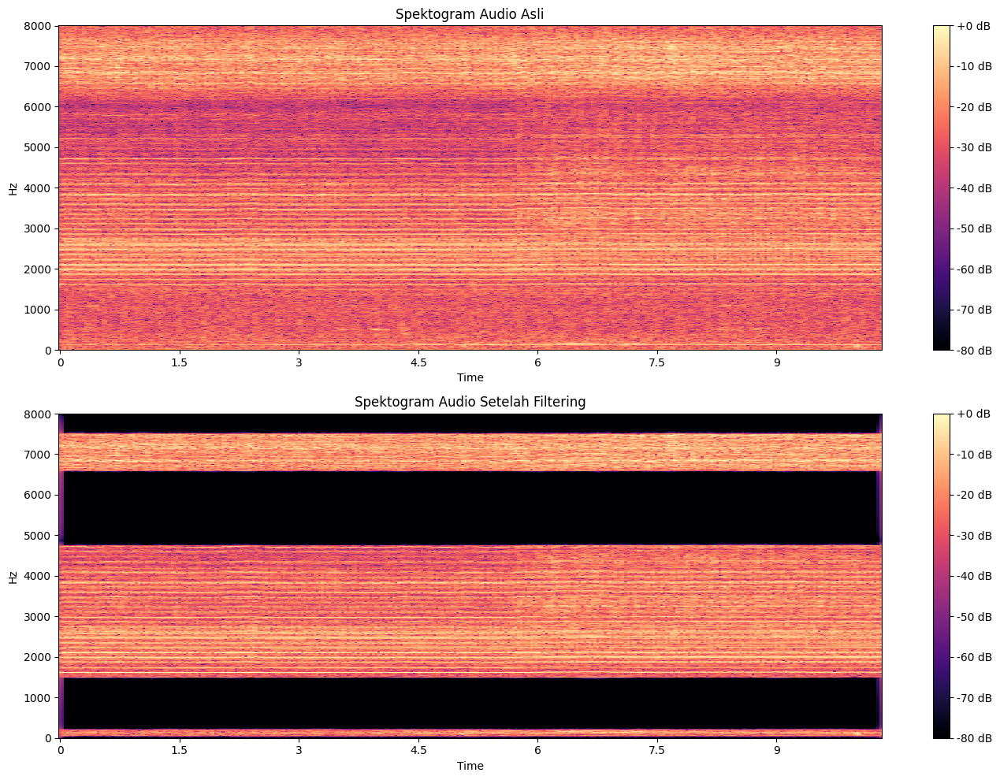

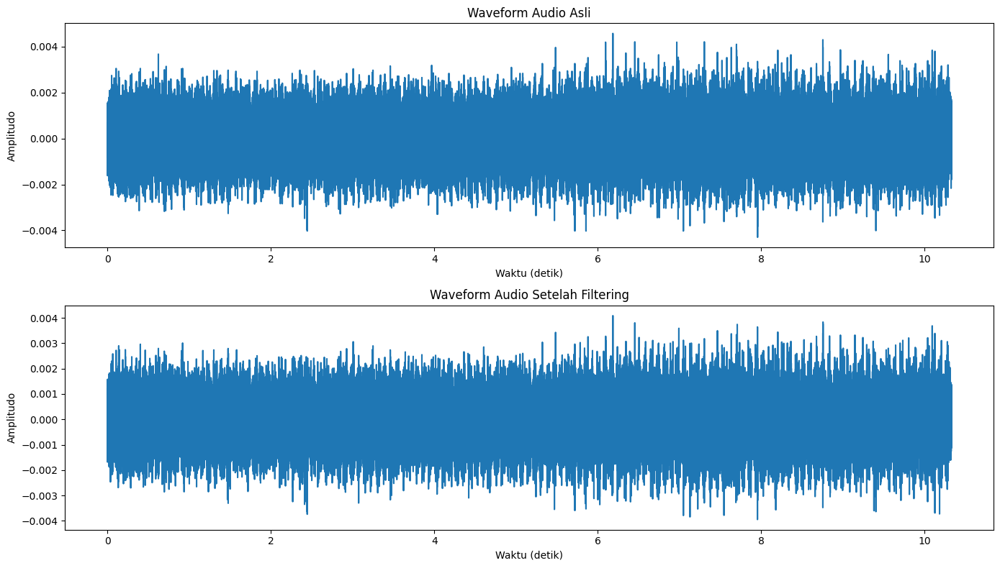


Analisis Hasil Filtering:
RMS asli: 0.000836
RMS setelah filtering: 0.000777
Persentase energi yang dipertahankan: 86.21%
Persentase energi yang dihilangkan: 13.79%
Audio yang telah difilter disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Bearing/1700_filtered_audio.wav

Memutar audio original...


Memutar audio yang telah difilter...


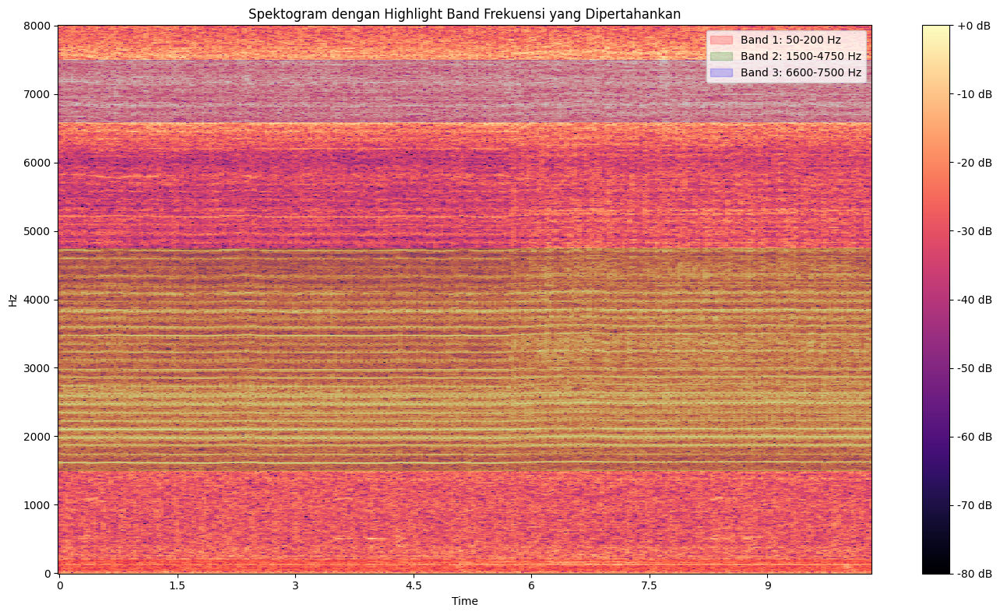

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
import os

# Path file input dan output
# Gunakan path file yang sama seperti sebelumnya kecuali Anda ingin mengubahnya
input_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Bearing/M4/1700.wav"
output_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Bearing/1700_filtered_audio.wav"

# Pastikan direktori output ada
os.makedirs(os.path.dirname(output_file), exist_ok=True)

def apply_multiband_filter(audio, sr, frequency_bands):
    """
    Menerapkan filter multi-band yang hanya mempertahankan rentang frekuensi tertentu

    Parameters:
    - audio: sinyal audio
    - sr: sample rate
    - frequency_bands: list dari tuple (freq_min, freq_max) yang akan dipertahankan

    Returns:
    - audio yang telah difilter, mask, freq array, fft data
    """
    print("Menerapkan filter multi-band...")

    # Hitung FFT
    n = len(audio)
    fft_data = np.fft.rfft(audio)
    freq = np.fft.rfftfreq(n, d=1/sr)

    # Buat mask untuk frekuensi yang akan dipertahankan
    mask = np.zeros_like(freq, dtype=bool)

    # Tandai frekuensi yang akan dipertahankan
    for freq_min, freq_max in frequency_bands:
        mask = np.logical_or(mask, np.logical_and(freq >= freq_min, freq <= freq_max))

    # Tampilkan informasi tentang frekuensi yang difilter
    print(f"Total bin frekuensi: {len(freq)}")
    print(f"Bin frekuensi yang dipertahankan: {np.sum(mask)}")
    print(f"Persentase bin frekuensi yang dipertahankan: {np.sum(mask)/len(freq)*100:.2f}%")

    # Terapkan filter (set frekuensi lain ke nol)
    fft_filtered = np.zeros_like(fft_data, dtype=complex)
    fft_filtered[mask] = fft_data[mask]

    # Konversi kembali ke domain waktu
    audio_filtered = np.fft.irfft(fft_filtered)

    return audio_filtered, mask, freq, fft_data

def plot_frequency_bands(freq, magnitude, mask, frequency_bands, title="Respon Frekuensi"):
    """
    Plot respon frekuensi dengan highlight pada band frekuensi yang dipertahankan
    """
    plt.figure(figsize=(14, 6))

    # Plot magnitude asli
    plt.plot(freq, magnitude, 'b', alpha=0.5, label='Spektrum Asli')

    # Plot frekuensi yang dipertahankan
    plt.plot(freq, magnitude * mask, 'r', label='Frekuensi Dipertahankan')

    # Highlight rentang frekuensi yang dipertahankan
    colors = ['g', 'y', 'm', 'c']  # Berbagai warna untuk setiap band
    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        color = colors[i % len(colors)]
        plt.axvspan(freq_min, freq_max, color=color, alpha=0.2,
                    label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

    plt.title(title)
    plt.xlabel('Frekuensi (Hz)')
    plt.ylabel('Magnitude (dinormalisasi)')
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.xlim(0, min(10000, max(freq)))  # Batasi tampilan hingga 10 kHz untuk kejelasan
    plt.tight_layout()
    plt.show()

def plot_spectrograms(audio_orig, audio_filtered, sr, title="Perbandingan Spektogram"):
    """
    Plot spektogram sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 10))

    # Spektogram asli
    plt.subplot(2, 1, 1)
    D = librosa.stft(audio_orig)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Asli")

    # Spektogram setelah filtering
    plt.subplot(2, 1, 2)
    D_filtered = librosa.stft(audio_filtered)
    S_db_filtered = librosa.amplitude_to_db(np.abs(D_filtered), ref=np.max)
    librosa.display.specshow(S_db_filtered, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Setelah Filtering")

    plt.tight_layout()
    plt.show()

def plot_waveforms(audio_orig, audio_filtered, sr, title="Perbandingan Waveform"):
    """
    Plot waveform sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 8))

    # Waveform asli
    plt.subplot(2, 1, 1)
    plt.title("Waveform Audio Asli")
    plt.plot(np.arange(len(audio_orig))/sr, audio_orig)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    # Waveform setelah filtering
    plt.subplot(2, 1, 2)
    plt.title("Waveform Audio Setelah Filtering")
    plt.plot(np.arange(len(audio_filtered))/sr, audio_filtered)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    plt.tight_layout()
    plt.show()

def create_band_visualization(freq, magnitude, frequency_bands):
    """
    Visualisasi yang lebih detail untuk setiap band frekuensi
    """
    fig, axs = plt.subplots(len(frequency_bands), 1, figsize=(14, 3*len(frequency_bands)))

    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        # Buat mask untuk band ini
        band_mask = np.logical_and(freq >= freq_min, freq <= freq_max)

        # Plot
        axs[i].plot(freq, magnitude, 'b', alpha=0.3)
        axs[i].plot(freq[band_mask], magnitude[band_mask], 'r')
        axs[i].set_title(f'Band {i+1}: {freq_min}-{freq_max} Hz')
        axs[i].set_xlabel('Frekuensi (Hz)')
        axs[i].set_ylabel('Magnitude')
        axs[i].grid(True)

        # Batasi view ke region band dengan margin
        margin = (freq_max - freq_min) * 0.2
        axs[i].set_xlim(max(0, freq_min - margin), freq_max + margin)

    plt.tight_layout()
    plt.show()

# Load audio
print(f"Memuat file audio: {input_file}")
audio, sr = librosa.load(input_file, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi audio: {len(audio)/sr:.2f} detik")

# Definisikan band frekuensi yang akan dipertahankan
frequency_bands = [
    (50, 200),  # Band 1: 1900-2200 Hz
    (1500, 4750),  # Band 2: 3000-3200 Hz
    (6600, 7500)   # Band 4: 6200-7500 Hz
]

# Terapkan filter
audio_filtered, freq_mask, freq, fft_data = apply_multiband_filter(audio, sr, frequency_bands)

# Dapatkan magnitude untuk visualisasi
magnitude = np.abs(fft_data)
magnitude_normalized = magnitude / np.max(magnitude)

# Visualisasi
print("\nMembuat visualisasi...\n")

# 1. Plot respon frekuensi dengan highlight band
plot_frequency_bands(freq, magnitude_normalized, freq_mask, frequency_bands,
                    "Respon Frekuensi dengan Multi-Band Filter")

# 2. Visualisasi detail untuk setiap band
create_band_visualization(freq, magnitude_normalized, frequency_bands)

# 3. Plot spektogram
plot_spectrograms(audio, audio_filtered, sr, "Perbandingan Spektogram")

# 4. Plot waveform
plot_waveforms(audio, audio_filtered, sr, "Perbandingan Waveform")

# Analisis hasil filtering
energy_original = np.sum(np.abs(fft_data)**2)
energy_kept = np.sum(np.abs(fft_data[freq_mask])**2)
percentage_kept = (energy_kept / energy_original) * 100

print("\nAnalisis Hasil Filtering:")
print(f"RMS asli: {np.sqrt(np.mean(audio**2)):.6f}")
print(f"RMS setelah filtering: {np.sqrt(np.mean(audio_filtered**2)):.6f}")
print(f"Persentase energi yang dipertahankan: {percentage_kept:.2f}%")
print(f"Persentase energi yang dihilangkan: {100 - percentage_kept:.2f}%")

# Simpan audio yang telah difilter
audio_filtered = audio_filtered / np.max(np.abs(audio_filtered))  # Normalisasi
sf.write(output_file, audio_filtered, sr)
print(f"Audio yang telah difilter disimpan di: {output_file}")

# Putar audio untuk perbandingan
print("\nMemutar audio original...")
import IPython.display as ipd
display(ipd.Audio(audio, rate=sr))

print("Memutar audio yang telah difilter...")
display(ipd.Audio(audio_filtered, rate=sr))

# Buat visualisasi spektrogram dalam bentuk heatmap dengan highlight band frekuensi
plt.figure(figsize=(14, 8))

# Hitung spektrogram
D = librosa.stft(audio)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Tampilkan spektrogram
img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(img, format='%+2.0f dB')

# Tambahkan highlight pada band frekuensi yang dipertahankan
colors = ['r', 'g', 'b', 'y']
for i, (freq_min, freq_max) in enumerate(frequency_bands):
    color = colors[i % len(colors)]
    plt.axhspan(freq_min, freq_max, color=color, alpha=0.2,
                label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

plt.title("Spektogram dengan Highlight Band Frekuensi yang Dipertahankan")
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

Memuat file audio: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Healthy/M1/1550.wav
Sample rate: 16000 Hz
Durasi audio: 10.25 detik
Menerapkan filter multi-band...
Total bin frekuensi: 82001
Bin frekuensi yang dipertahankan: 31573
Persentase bin frekuensi yang dipertahankan: 38.50%

Membuat visualisasi...



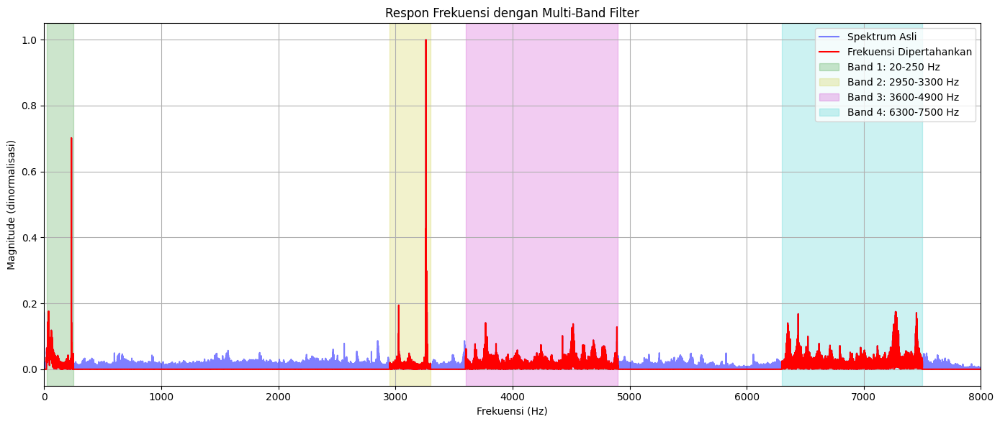

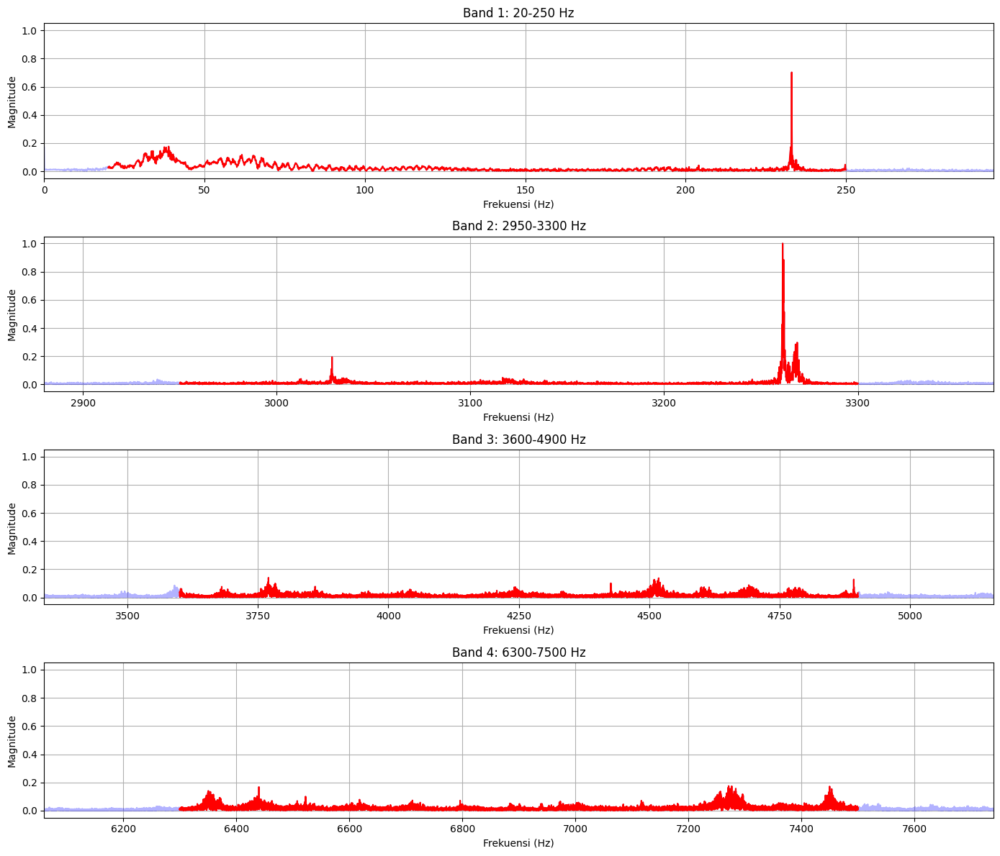

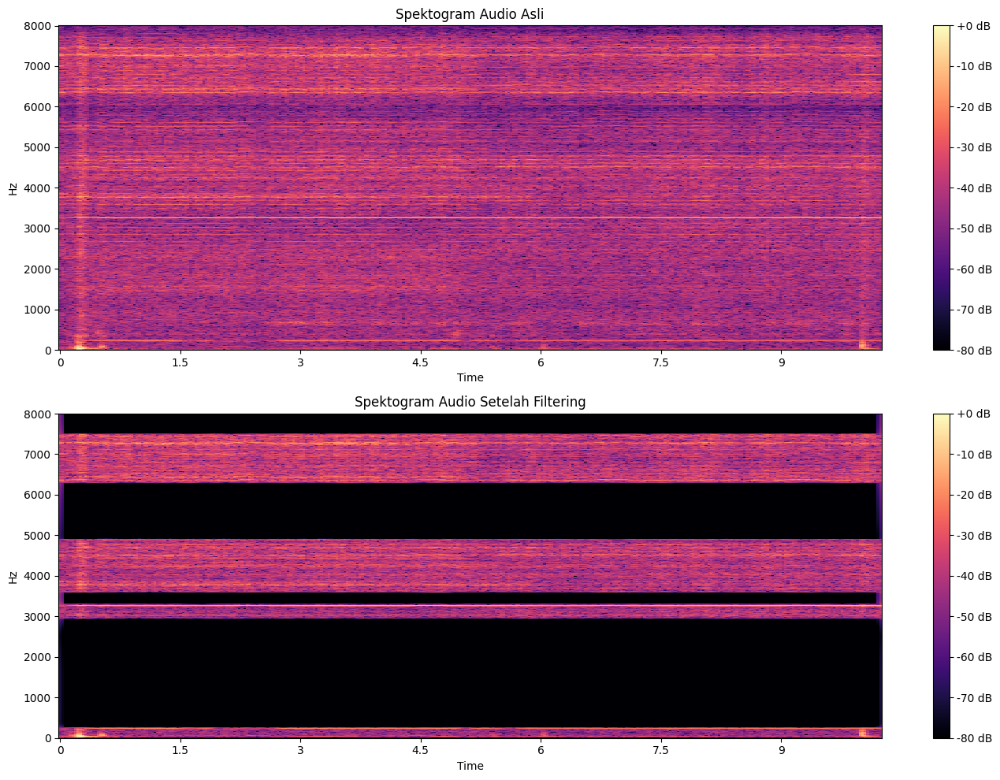

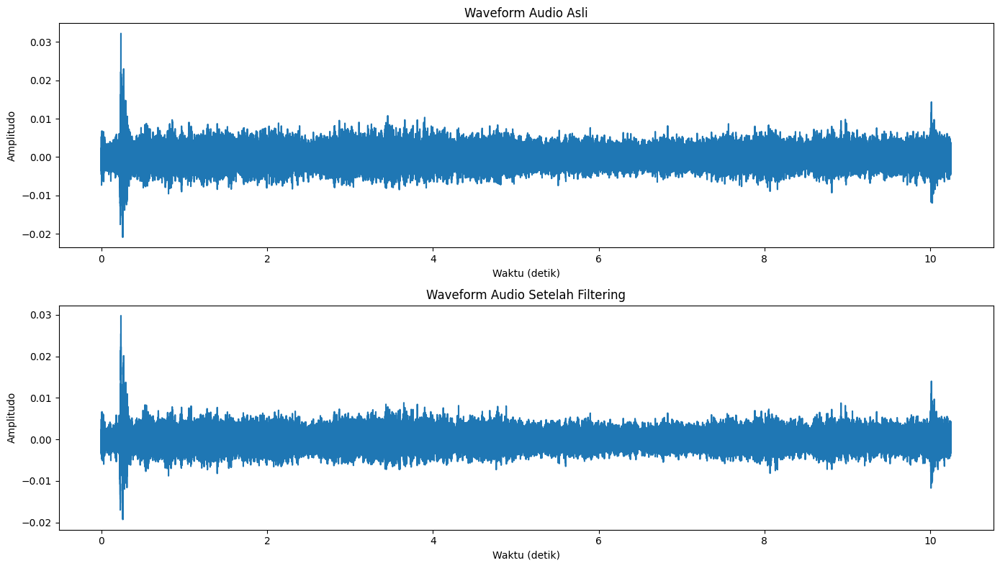


Analisis Hasil Filtering:
RMS asli: 0.002089
RMS setelah filtering: 0.001875
Persentase energi yang dipertahankan: 80.54%
Persentase energi yang dihilangkan: 19.46%
Audio yang telah difilter disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1550_cleanedhealt_audio.wav

Memutar audio original...


Memutar audio yang telah difilter...


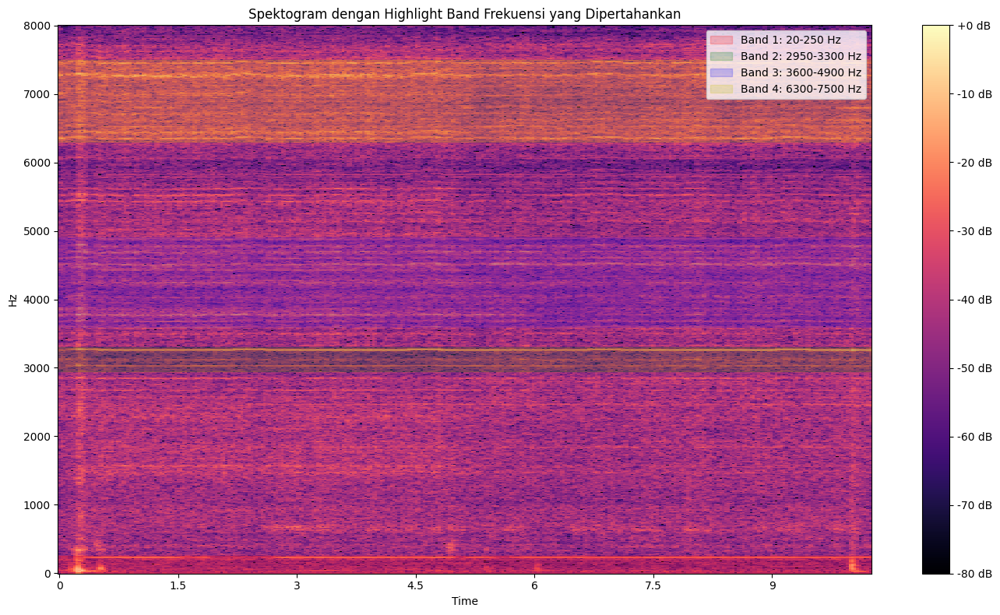

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
import os

# Path file input dan output
# Gunakan path file yang sama seperti sebelumnya kecuali Anda ingin mengubahnya
input_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Healthy/M1/1550.wav"
output_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1550_cleanedhealt_audio.wav"

# Pastikan direktori output ada
os.makedirs(os.path.dirname(output_file), exist_ok=True)

def apply_multiband_filter(audio, sr, frequency_bands):
    """
    Menerapkan filter multi-band yang hanya mempertahankan rentang frekuensi tertentu

    Parameters:
    - audio: sinyal audio
    - sr: sample rate
    - frequency_bands: list dari tuple (freq_min, freq_max) yang akan dipertahankan

    Returns:
    - audio yang telah difilter, mask, freq array, fft data
    """
    print("Menerapkan filter multi-band...")

    # Hitung FFT
    n = len(audio)
    fft_data = np.fft.rfft(audio)
    freq = np.fft.rfftfreq(n, d=1/sr)

    # Buat mask untuk frekuensi yang akan dipertahankan
    mask = np.zeros_like(freq, dtype=bool)

    # Tandai frekuensi yang akan dipertahankan
    for freq_min, freq_max in frequency_bands:
        mask = np.logical_or(mask, np.logical_and(freq >= freq_min, freq <= freq_max))

    # Tampilkan informasi tentang frekuensi yang difilter
    print(f"Total bin frekuensi: {len(freq)}")
    print(f"Bin frekuensi yang dipertahankan: {np.sum(mask)}")
    print(f"Persentase bin frekuensi yang dipertahankan: {np.sum(mask)/len(freq)*100:.2f}%")

    # Terapkan filter (set frekuensi lain ke nol)
    fft_filtered = np.zeros_like(fft_data, dtype=complex)
    fft_filtered[mask] = fft_data[mask]

    # Konversi kembali ke domain waktu
    audio_filtered = np.fft.irfft(fft_filtered)

    return audio_filtered, mask, freq, fft_data

def plot_frequency_bands(freq, magnitude, mask, frequency_bands, title="Respon Frekuensi"):
    """
    Plot respon frekuensi dengan highlight pada band frekuensi yang dipertahankan
    """
    plt.figure(figsize=(14, 6))

    # Plot magnitude asli
    plt.plot(freq, magnitude, 'b', alpha=0.5, label='Spektrum Asli')

    # Plot frekuensi yang dipertahankan
    plt.plot(freq, magnitude * mask, 'r', label='Frekuensi Dipertahankan')

    # Highlight rentang frekuensi yang dipertahankan
    colors = ['g', 'y', 'm', 'c']  # Berbagai warna untuk setiap band
    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        color = colors[i % len(colors)]
        plt.axvspan(freq_min, freq_max, color=color, alpha=0.2,
                    label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

    plt.title(title)
    plt.xlabel('Frekuensi (Hz)')
    plt.ylabel('Magnitude (dinormalisasi)')
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.xlim(0, min(10000, max(freq)))  # Batasi tampilan hingga 10 kHz untuk kejelasan
    plt.tight_layout()
    plt.show()

def plot_spectrograms(audio_orig, audio_filtered, sr, title="Perbandingan Spektogram"):
    """
    Plot spektogram sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 10))

    # Spektogram asli
    plt.subplot(2, 1, 1)
    D = librosa.stft(audio_orig)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Asli")

    # Spektogram setelah filtering
    plt.subplot(2, 1, 2)
    D_filtered = librosa.stft(audio_filtered)
    S_db_filtered = librosa.amplitude_to_db(np.abs(D_filtered), ref=np.max)
    librosa.display.specshow(S_db_filtered, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Setelah Filtering")

    plt.tight_layout()
    plt.show()

def plot_waveforms(audio_orig, audio_filtered, sr, title="Perbandingan Waveform"):
    """
    Plot waveform sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 8))

    # Waveform asli
    plt.subplot(2, 1, 1)
    plt.title("Waveform Audio Asli")
    plt.plot(np.arange(len(audio_orig))/sr, audio_orig)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    # Waveform setelah filtering
    plt.subplot(2, 1, 2)
    plt.title("Waveform Audio Setelah Filtering")
    plt.plot(np.arange(len(audio_filtered))/sr, audio_filtered)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    plt.tight_layout()
    plt.show()

def create_band_visualization(freq, magnitude, frequency_bands):
    """
    Visualisasi yang lebih detail untuk setiap band frekuensi
    """
    fig, axs = plt.subplots(len(frequency_bands), 1, figsize=(14, 3*len(frequency_bands)))

    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        # Buat mask untuk band ini
        band_mask = np.logical_and(freq >= freq_min, freq <= freq_max)

        # Plot
        axs[i].plot(freq, magnitude, 'b', alpha=0.3)
        axs[i].plot(freq[band_mask], magnitude[band_mask], 'r')
        axs[i].set_title(f'Band {i+1}: {freq_min}-{freq_max} Hz')
        axs[i].set_xlabel('Frekuensi (Hz)')
        axs[i].set_ylabel('Magnitude')
        axs[i].grid(True)

        # Batasi view ke region band dengan margin
        margin = (freq_max - freq_min) * 0.2
        axs[i].set_xlim(max(0, freq_min - margin), freq_max + margin)

    plt.tight_layout()
    plt.show()

# Load audio
print(f"Memuat file audio: {input_file}")
audio, sr = librosa.load(input_file, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi audio: {len(audio)/sr:.2f} detik")

# Definisikan band frekuensi yang akan dipertahankan
frequency_bands = [
    (20, 250),  # Band 1: 1900-2200 Hz
    (2950, 3300),  # Band 2: 3000-3200 Hz
    (3600, 4900),  # Band 3: 4000-5000 Hz
    (6300, 7500)   # Band 4: 6200-7500 Hz
]

# Terapkan filter
audio_filtered, freq_mask, freq, fft_data = apply_multiband_filter(audio, sr, frequency_bands)

# Dapatkan magnitude untuk visualisasi
magnitude = np.abs(fft_data)
magnitude_normalized = magnitude / np.max(magnitude)

# Visualisasi
print("\nMembuat visualisasi...\n")

# 1. Plot respon frekuensi dengan highlight band
plot_frequency_bands(freq, magnitude_normalized, freq_mask, frequency_bands,
                    "Respon Frekuensi dengan Multi-Band Filter")

# 2. Visualisasi detail untuk setiap band
create_band_visualization(freq, magnitude_normalized, frequency_bands)

# 3. Plot spektogram
plot_spectrograms(audio, audio_filtered, sr, "Perbandingan Spektogram")

# 4. Plot waveform
plot_waveforms(audio, audio_filtered, sr, "Perbandingan Waveform")

# Analisis hasil filtering
energy_original = np.sum(np.abs(fft_data)**2)
energy_kept = np.sum(np.abs(fft_data[freq_mask])**2)
percentage_kept = (energy_kept / energy_original) * 100

print("\nAnalisis Hasil Filtering:")
print(f"RMS asli: {np.sqrt(np.mean(audio**2)):.6f}")
print(f"RMS setelah filtering: {np.sqrt(np.mean(audio_filtered**2)):.6f}")
print(f"Persentase energi yang dipertahankan: {percentage_kept:.2f}%")
print(f"Persentase energi yang dihilangkan: {100 - percentage_kept:.2f}%")

# Simpan audio yang telah difilter
audio_filtered = audio_filtered / np.max(np.abs(audio_filtered))  # Normalisasi
sf.write(output_file, audio_filtered, sr)
print(f"Audio yang telah difilter disimpan di: {output_file}")

# Putar audio untuk perbandingan
print("\nMemutar audio original...")
import IPython.display as ipd
display(ipd.Audio(audio, rate=sr))

print("Memutar audio yang telah difilter...")
display(ipd.Audio(audio_filtered, rate=sr))

# Buat visualisasi spektrogram dalam bentuk heatmap dengan highlight band frekuensi
plt.figure(figsize=(14, 8))

# Hitung spektrogram
D = librosa.stft(audio)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Tampilkan spektrogram
img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(img, format='%+2.0f dB')

# Tambahkan highlight pada band frekuensi yang dipertahankan
colors = ['r', 'g', 'b', 'y']
for i, (freq_min, freq_max) in enumerate(frequency_bands):
    color = colors[i % len(colors)]
    plt.axhspan(freq_min, freq_max, color=color, alpha=0.2,
                label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

plt.title("Spektogram dengan Highlight Band Frekuensi yang Dipertahankan")
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

Memuat file audio: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Propeller/M2/1400.wav
Sample rate: 16000 Hz
Durasi audio: 10.21 detik
Menerapkan filter multi-band...
Total bin frekuensi: 81641
Bin frekuensi yang dipertahankan: 35720
Persentase bin frekuensi yang dipertahankan: 43.75%

Membuat visualisasi...



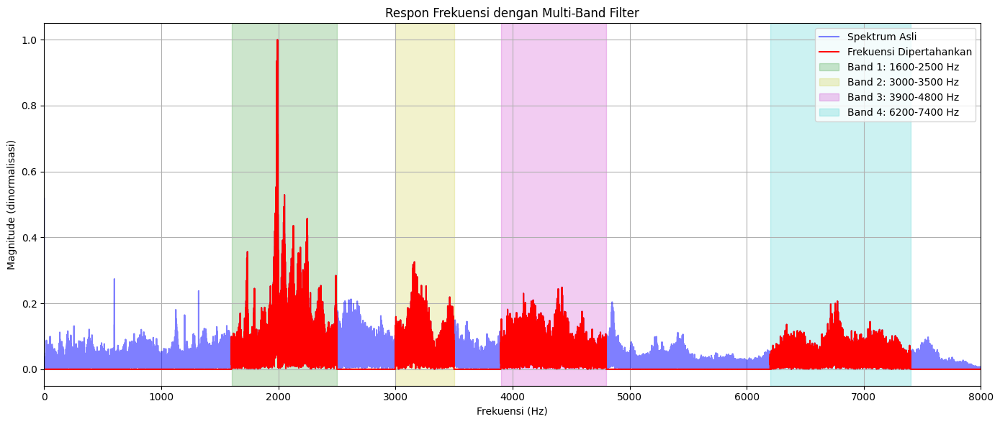

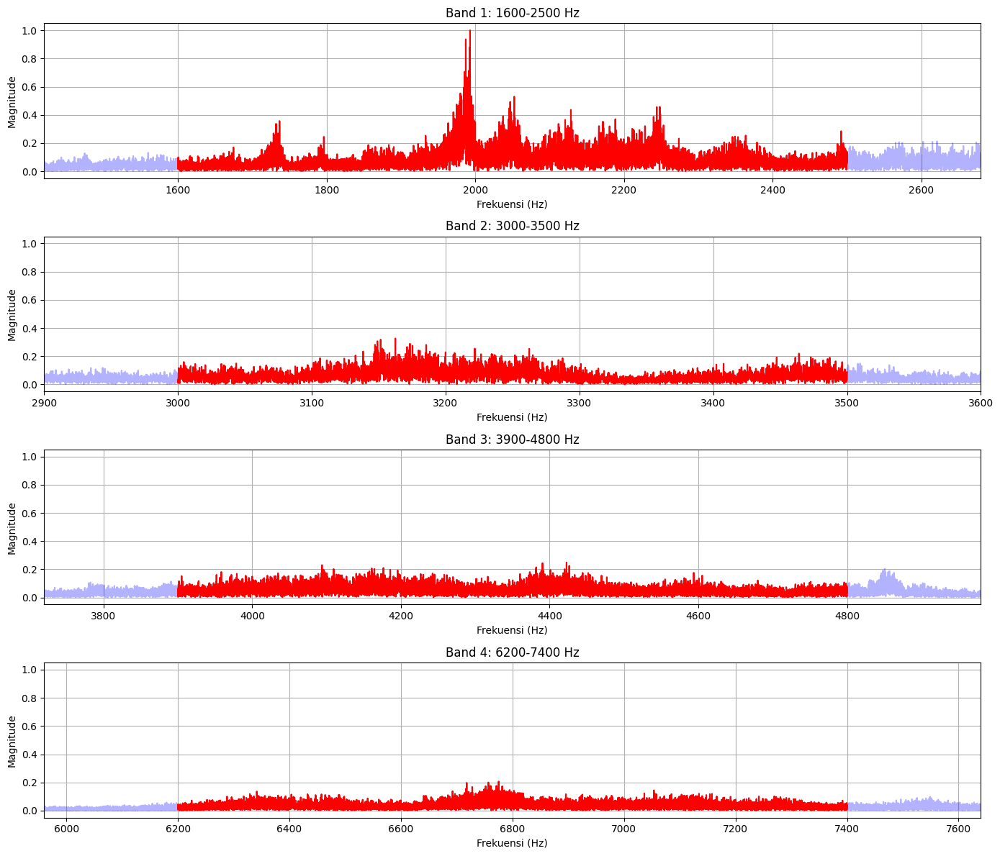

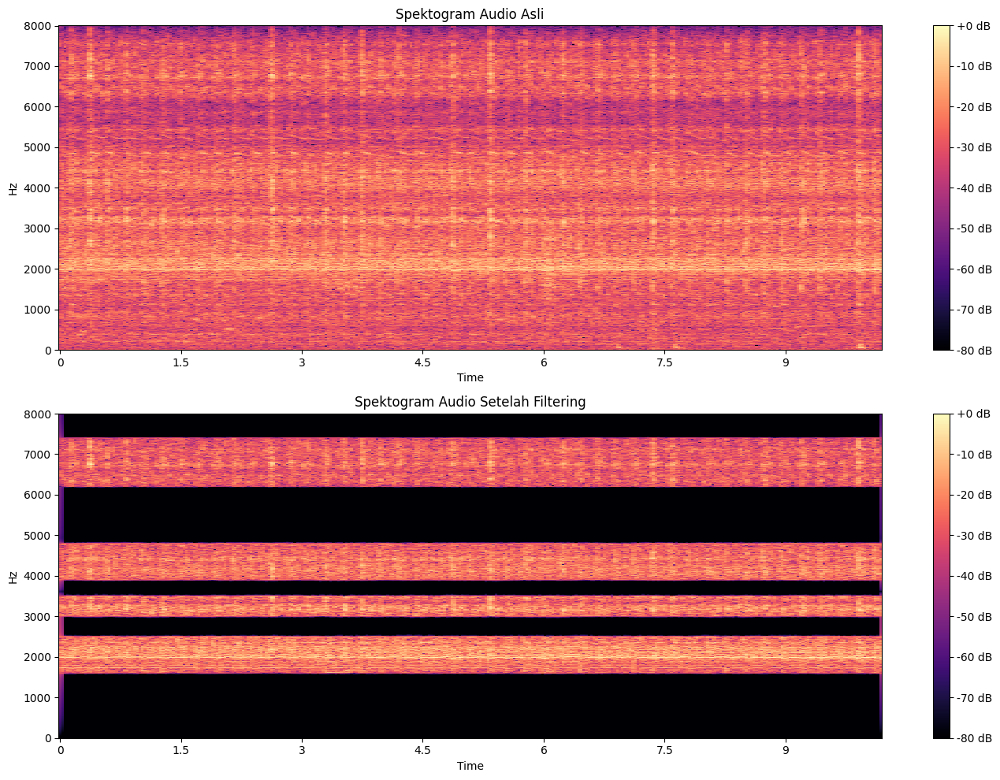

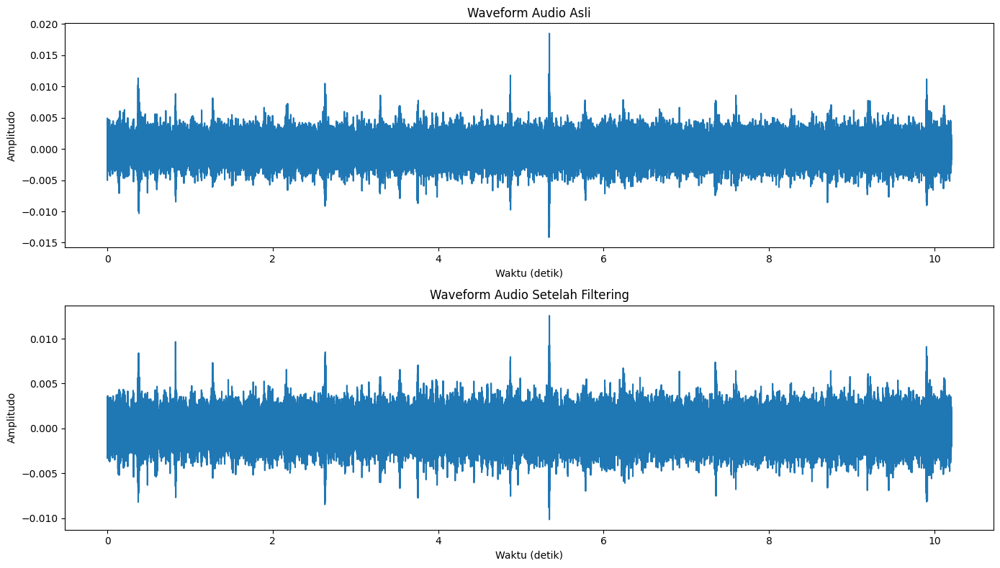


Analisis Hasil Filtering:
RMS asli: 0.001547
RMS setelah filtering: 0.001362
Persentase energi yang dipertahankan: 77.41%
Persentase energi yang dihilangkan: 22.59%
Audio yang telah difilter disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Propeller/1400_cleanedProp_audio.wav

Memutar audio original...


Memutar audio yang telah difilter...


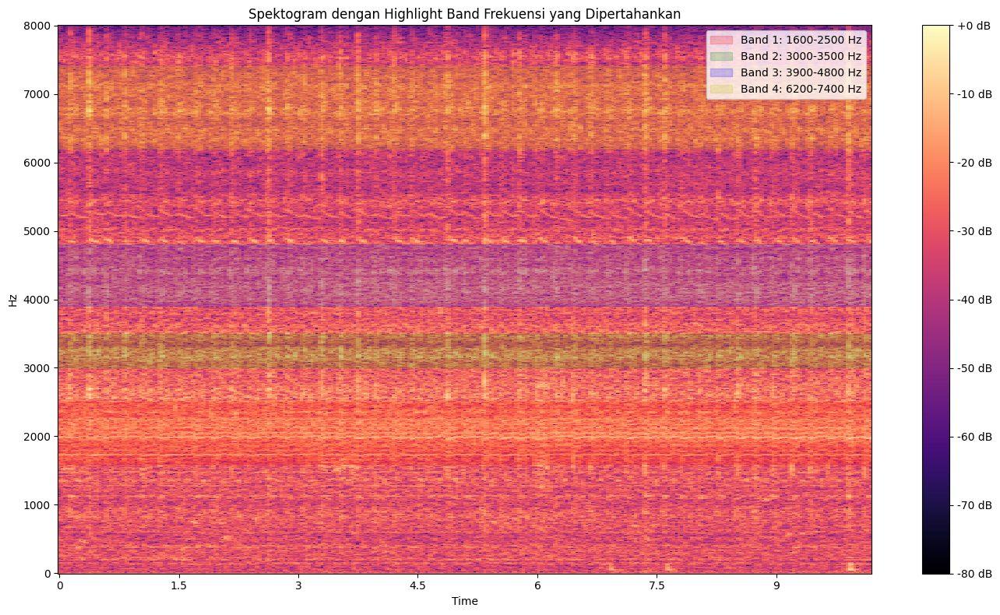

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
import os

# Path file input dan output
# Gunakan path file yang sama seperti sebelumnya kecuali Anda ingin mengubahnya
input_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Propeller/M2/1400.wav"
output_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Propeller/1400_cleanedProp_audio.wav"

# Pastikan direktori output ada
os.makedirs(os.path.dirname(output_file), exist_ok=True)

def apply_multiband_filter(audio, sr, frequency_bands):
    """
    Menerapkan filter multi-band yang hanya mempertahankan rentang frekuensi tertentu

    Parameters:
    - audio: sinyal audio
    - sr: sample rate
    - frequency_bands: list dari tuple (freq_min, freq_max) yang akan dipertahankan

    Returns:
    - audio yang telah difilter, mask, freq array, fft data
    """
    print("Menerapkan filter multi-band...")

    # Hitung FFT
    n = len(audio)
    fft_data = np.fft.rfft(audio)
    freq = np.fft.rfftfreq(n, d=1/sr)

    # Buat mask untuk frekuensi yang akan dipertahankan
    mask = np.zeros_like(freq, dtype=bool)

    # Tandai frekuensi yang akan dipertahankan
    for freq_min, freq_max in frequency_bands:
        mask = np.logical_or(mask, np.logical_and(freq >= freq_min, freq <= freq_max))

    # Tampilkan informasi tentang frekuensi yang difilter
    print(f"Total bin frekuensi: {len(freq)}")
    print(f"Bin frekuensi yang dipertahankan: {np.sum(mask)}")
    print(f"Persentase bin frekuensi yang dipertahankan: {np.sum(mask)/len(freq)*100:.2f}%")

    # Terapkan filter (set frekuensi lain ke nol)
    fft_filtered = np.zeros_like(fft_data, dtype=complex)
    fft_filtered[mask] = fft_data[mask]

    # Konversi kembali ke domain waktu
    audio_filtered = np.fft.irfft(fft_filtered)

    return audio_filtered, mask, freq, fft_data

def plot_frequency_bands(freq, magnitude, mask, frequency_bands, title="Respon Frekuensi"):
    """
    Plot respon frekuensi dengan highlight pada band frekuensi yang dipertahankan
    """
    plt.figure(figsize=(14, 6))

    # Plot magnitude asli
    plt.plot(freq, magnitude, 'b', alpha=0.5, label='Spektrum Asli')

    # Plot frekuensi yang dipertahankan
    plt.plot(freq, magnitude * mask, 'r', label='Frekuensi Dipertahankan')

    # Highlight rentang frekuensi yang dipertahankan
    colors = ['g', 'y', 'm', 'c']  # Berbagai warna untuk setiap band
    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        color = colors[i % len(colors)]
        plt.axvspan(freq_min, freq_max, color=color, alpha=0.2,
                    label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

    plt.title(title)
    plt.xlabel('Frekuensi (Hz)')
    plt.ylabel('Magnitude (dinormalisasi)')
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.xlim(0, min(10000, max(freq)))  # Batasi tampilan hingga 10 kHz untuk kejelasan
    plt.tight_layout()
    plt.show()

def plot_spectrograms(audio_orig, audio_filtered, sr, title="Perbandingan Spektogram"):
    """
    Plot spektogram sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 10))

    # Spektogram asli
    plt.subplot(2, 1, 1)
    D = librosa.stft(audio_orig)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Asli")

    # Spektogram setelah filtering
    plt.subplot(2, 1, 2)
    D_filtered = librosa.stft(audio_filtered)
    S_db_filtered = librosa.amplitude_to_db(np.abs(D_filtered), ref=np.max)
    librosa.display.specshow(S_db_filtered, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Setelah Filtering")

    plt.tight_layout()
    plt.show()

def plot_waveforms(audio_orig, audio_filtered, sr, title="Perbandingan Waveform"):
    """
    Plot waveform sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 8))

    # Waveform asli
    plt.subplot(2, 1, 1)
    plt.title("Waveform Audio Asli")
    plt.plot(np.arange(len(audio_orig))/sr, audio_orig)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    # Waveform setelah filtering
    plt.subplot(2, 1, 2)
    plt.title("Waveform Audio Setelah Filtering")
    plt.plot(np.arange(len(audio_filtered))/sr, audio_filtered)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    plt.tight_layout()
    plt.show()

def create_band_visualization(freq, magnitude, frequency_bands):
    """
    Visualisasi yang lebih detail untuk setiap band frekuensi
    """
    fig, axs = plt.subplots(len(frequency_bands), 1, figsize=(14, 3*len(frequency_bands)))

    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        # Buat mask untuk band ini
        band_mask = np.logical_and(freq >= freq_min, freq <= freq_max)

        # Plot
        axs[i].plot(freq, magnitude, 'b', alpha=0.3)
        axs[i].plot(freq[band_mask], magnitude[band_mask], 'r')
        axs[i].set_title(f'Band {i+1}: {freq_min}-{freq_max} Hz')
        axs[i].set_xlabel('Frekuensi (Hz)')
        axs[i].set_ylabel('Magnitude')
        axs[i].grid(True)

        # Batasi view ke region band dengan margin
        margin = (freq_max - freq_min) * 0.2
        axs[i].set_xlim(max(0, freq_min - margin), freq_max + margin)

    plt.tight_layout()
    plt.show()

# Load audio
print(f"Memuat file audio: {input_file}")
audio, sr = librosa.load(input_file, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi audio: {len(audio)/sr:.2f} detik")

# Definisikan band frekuensi yang akan dipertahankan
frequency_bands = [
    (1600, 2500),  # Band 1: 1900-2200 Hz
    (3000, 3500),  # Band 2: 3000-3200 Hz
    (3900, 4800),  # Band 3: 4000-5000 Hz
    (6200, 7400)   # Band 4: 6200-7500 Hz
]

# Terapkan filter
audio_filtered, freq_mask, freq, fft_data = apply_multiband_filter(audio, sr, frequency_bands)

# Dapatkan magnitude untuk visualisasi
magnitude = np.abs(fft_data)
magnitude_normalized = magnitude / np.max(magnitude)

# Visualisasi
print("\nMembuat visualisasi...\n")

# 1. Plot respon frekuensi dengan highlight band
plot_frequency_bands(freq, magnitude_normalized, freq_mask, frequency_bands,
                    "Respon Frekuensi dengan Multi-Band Filter")

# 2. Visualisasi detail untuk setiap band
create_band_visualization(freq, magnitude_normalized, frequency_bands)

# 3. Plot spektogram
plot_spectrograms(audio, audio_filtered, sr, "Perbandingan Spektogram")

# 4. Plot waveform
plot_waveforms(audio, audio_filtered, sr, "Perbandingan Waveform")

# Analisis hasil filtering
energy_original = np.sum(np.abs(fft_data)**2)
energy_kept = np.sum(np.abs(fft_data[freq_mask])**2)
percentage_kept = (energy_kept / energy_original) * 100

print("\nAnalisis Hasil Filtering:")
print(f"RMS asli: {np.sqrt(np.mean(audio**2)):.6f}")
print(f"RMS setelah filtering: {np.sqrt(np.mean(audio_filtered**2)):.6f}")
print(f"Persentase energi yang dipertahankan: {percentage_kept:.2f}%")
print(f"Persentase energi yang dihilangkan: {100 - percentage_kept:.2f}%")

# Simpan audio yang telah difilter
audio_filtered = audio_filtered / np.max(np.abs(audio_filtered))  # Normalisasi
sf.write(output_file, audio_filtered, sr)
print(f"Audio yang telah difilter disimpan di: {output_file}")

# Putar audio untuk perbandingan
print("\nMemutar audio original...")
import IPython.display as ipd
display(ipd.Audio(audio, rate=sr))

print("Memutar audio yang telah difilter...")
display(ipd.Audio(audio_filtered, rate=sr))

# Buat visualisasi spektrogram dalam bentuk heatmap dengan highlight band frekuensi
plt.figure(figsize=(14, 8))

# Hitung spektrogram
D = librosa.stft(audio)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Tampilkan spektrogram
img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(img, format='%+2.0f dB')

# Tambahkan highlight pada band frekuensi yang dipertahankan
colors = ['r', 'g', 'b', 'y']
for i, (freq_min, freq_max) in enumerate(frequency_bands):
    color = colors[i % len(colors)]
    plt.axhspan(freq_min, freq_max, color=color, alpha=0.2,
                label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

plt.title("Spektogram dengan Highlight Band Frekuensi yang Dipertahankan")
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

Memuat file audio: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Healthy/M1/1450.wav
Sample rate: 16000 Hz
Durasi audio: 10.27 detik
Menerapkan filter multi-band...
Total bin frekuensi: 82121
Bin frekuensi yang dipertahankan: 31312
Persentase bin frekuensi yang dipertahankan: 38.13%

Membuat visualisasi...



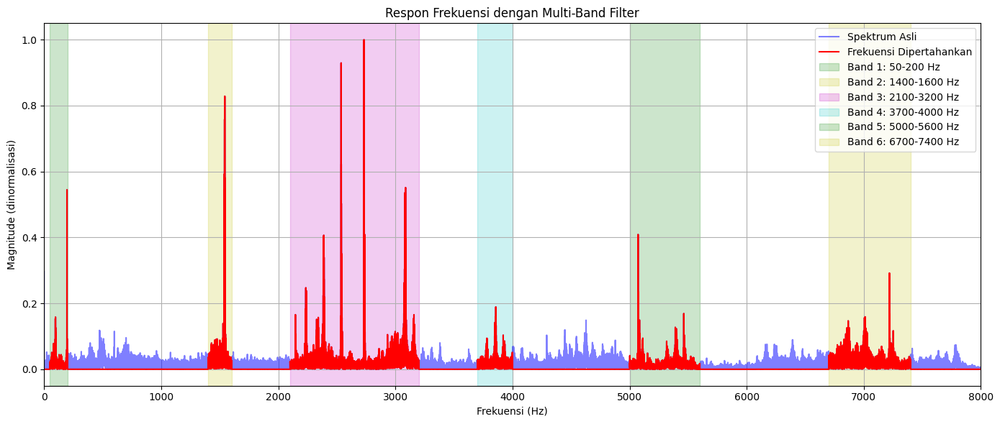

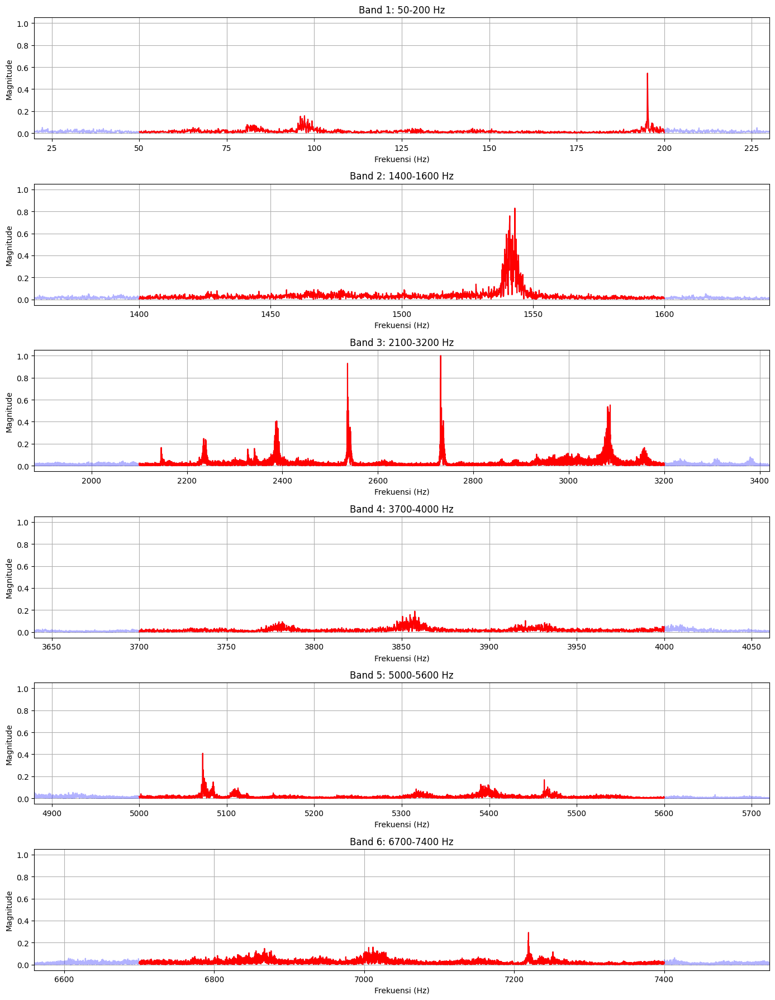

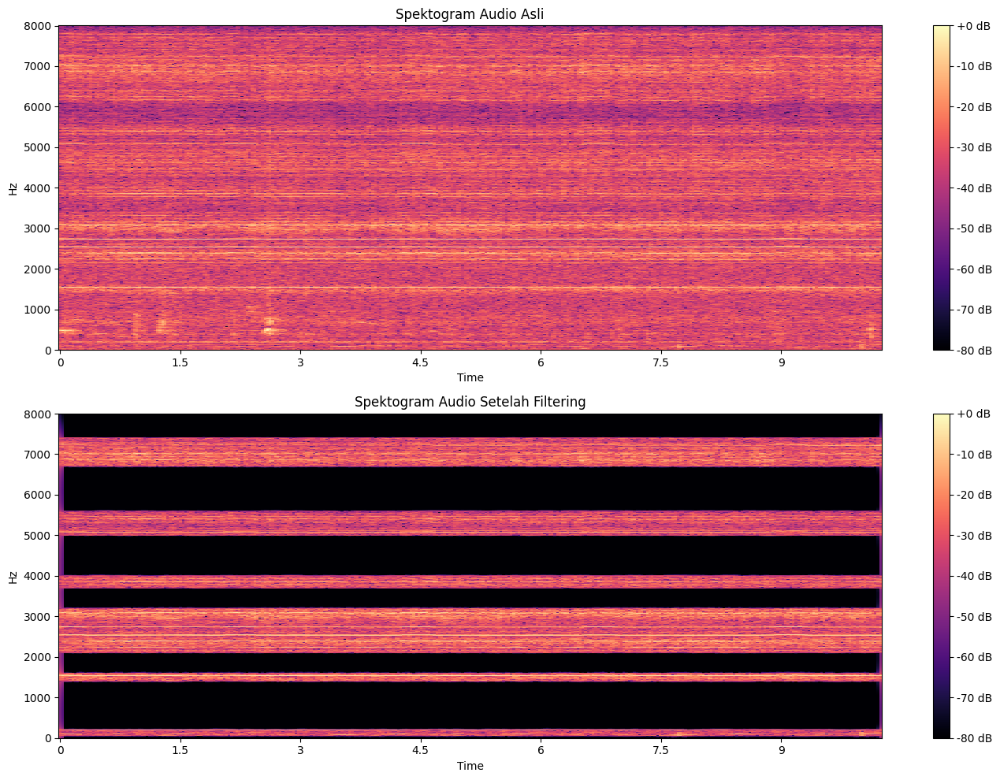

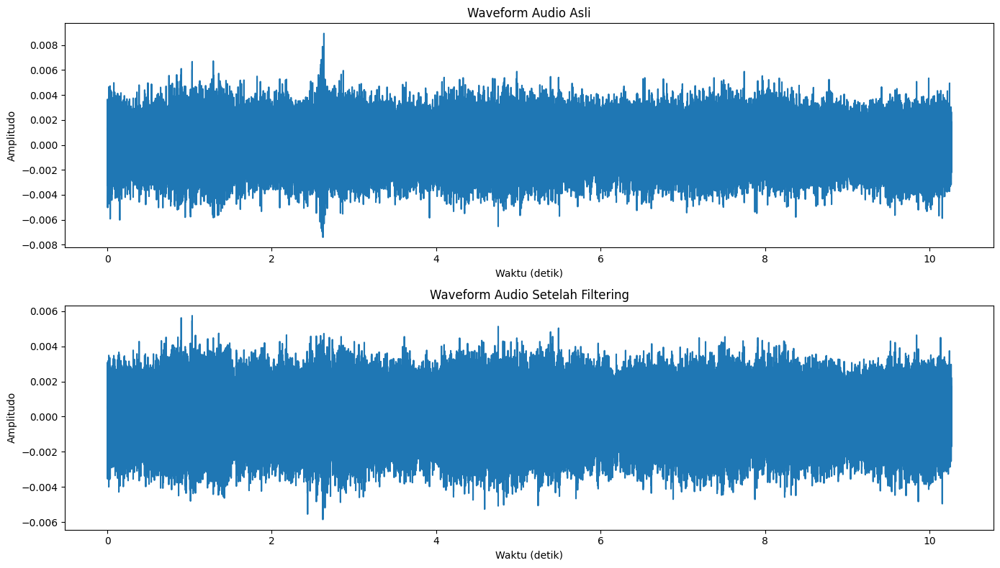


Analisis Hasil Filtering:
RMS asli: 0.001401
RMS setelah filtering: 0.001246
Persentase energi yang dipertahankan: 79.10%
Persentase energi yang dihilangkan: 20.90%
Audio yang telah difilter disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1450_test_helath_audio.wav

Memutar audio original...


Memutar audio yang telah difilter...


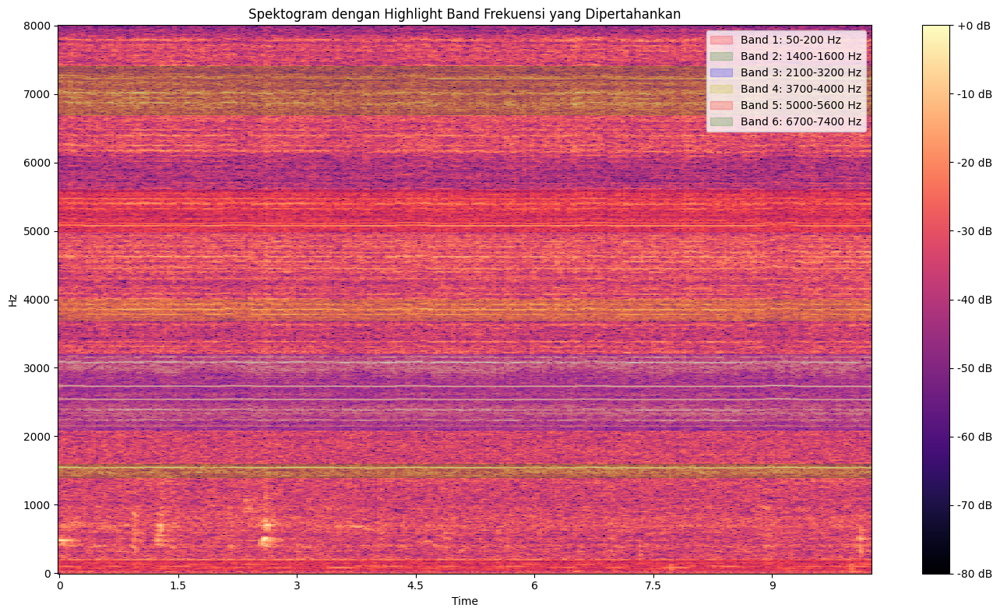

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
import os

# Path file input dan output
# Gunakan path file yang sama seperti sebelumnya kecuali Anda ingin mengubahnya
input_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Healthy/M1/1450.wav"
output_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1450_test_helath_audio.wav"

# Pastikan direktori output ada
os.makedirs(os.path.dirname(output_file), exist_ok=True)

def apply_multiband_filter(audio, sr, frequency_bands):
    """
    Menerapkan filter multi-band yang hanya mempertahankan rentang frekuensi tertentu

    Parameters:
    - audio: sinyal audio
    - sr: sample rate
    - frequency_bands: list dari tuple (freq_min, freq_max) yang akan dipertahankan

    Returns:
    - audio yang telah difilter, mask, freq array, fft data
    """
    print("Menerapkan filter multi-band...")

    # Hitung FFT
    n = len(audio)
    fft_data = np.fft.rfft(audio)
    freq = np.fft.rfftfreq(n, d=1/sr)

    # Buat mask untuk frekuensi yang akan dipertahankan
    mask = np.zeros_like(freq, dtype=bool)

    # Tandai frekuensi yang akan dipertahankan
    for freq_min, freq_max in frequency_bands:
        mask = np.logical_or(mask, np.logical_and(freq >= freq_min, freq <= freq_max))

    # Tampilkan informasi tentang frekuensi yang difilter
    print(f"Total bin frekuensi: {len(freq)}")
    print(f"Bin frekuensi yang dipertahankan: {np.sum(mask)}")
    print(f"Persentase bin frekuensi yang dipertahankan: {np.sum(mask)/len(freq)*100:.2f}%")

    # Terapkan filter (set frekuensi lain ke nol)
    fft_filtered = np.zeros_like(fft_data, dtype=complex)
    fft_filtered[mask] = fft_data[mask]

    # Konversi kembali ke domain waktu
    audio_filtered = np.fft.irfft(fft_filtered)

    return audio_filtered, mask, freq, fft_data

def plot_frequency_bands(freq, magnitude, mask, frequency_bands, title="Respon Frekuensi"):
    """
    Plot respon frekuensi dengan highlight pada band frekuensi yang dipertahankan
    """
    plt.figure(figsize=(14, 6))

    # Plot magnitude asli
    plt.plot(freq, magnitude, 'b', alpha=0.5, label='Spektrum Asli')

    # Plot frekuensi yang dipertahankan
    plt.plot(freq, magnitude * mask, 'r', label='Frekuensi Dipertahankan')

    # Highlight rentang frekuensi yang dipertahankan
    colors = ['g', 'y', 'm', 'c']  # Berbagai warna untuk setiap band
    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        color = colors[i % len(colors)]
        plt.axvspan(freq_min, freq_max, color=color, alpha=0.2,
                    label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

    plt.title(title)
    plt.xlabel('Frekuensi (Hz)')
    plt.ylabel('Magnitude (dinormalisasi)')
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.xlim(0, min(10000, max(freq)))  # Batasi tampilan hingga 10 kHz untuk kejelasan
    plt.tight_layout()
    plt.show()

def plot_spectrograms(audio_orig, audio_filtered, sr, title="Perbandingan Spektogram"):
    """
    Plot spektogram sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 10))

    # Spektogram asli
    plt.subplot(2, 1, 1)
    D = librosa.stft(audio_orig)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Asli")

    # Spektogram setelah filtering
    plt.subplot(2, 1, 2)
    D_filtered = librosa.stft(audio_filtered)
    S_db_filtered = librosa.amplitude_to_db(np.abs(D_filtered), ref=np.max)
    librosa.display.specshow(S_db_filtered, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title("Spektogram Audio Setelah Filtering")

    plt.tight_layout()
    plt.show()

def plot_waveforms(audio_orig, audio_filtered, sr, title="Perbandingan Waveform"):
    """
    Plot waveform sebelum dan sesudah filtering
    """
    plt.figure(figsize=(14, 8))

    # Waveform asli
    plt.subplot(2, 1, 1)
    plt.title("Waveform Audio Asli")
    plt.plot(np.arange(len(audio_orig))/sr, audio_orig)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    # Waveform setelah filtering
    plt.subplot(2, 1, 2)
    plt.title("Waveform Audio Setelah Filtering")
    plt.plot(np.arange(len(audio_filtered))/sr, audio_filtered)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    plt.tight_layout()
    plt.show()

def create_band_visualization(freq, magnitude, frequency_bands):
    """
    Visualisasi yang lebih detail untuk setiap band frekuensi
    """
    fig, axs = plt.subplots(len(frequency_bands), 1, figsize=(14, 3*len(frequency_bands)))

    for i, (freq_min, freq_max) in enumerate(frequency_bands):
        # Buat mask untuk band ini
        band_mask = np.logical_and(freq >= freq_min, freq <= freq_max)

        # Plot
        axs[i].plot(freq, magnitude, 'b', alpha=0.3)
        axs[i].plot(freq[band_mask], magnitude[band_mask], 'r')
        axs[i].set_title(f'Band {i+1}: {freq_min}-{freq_max} Hz')
        axs[i].set_xlabel('Frekuensi (Hz)')
        axs[i].set_ylabel('Magnitude')
        axs[i].grid(True)

        # Batasi view ke region band dengan margin
        margin = (freq_max - freq_min) * 0.2
        axs[i].set_xlim(max(0, freq_min - margin), freq_max + margin)

    plt.tight_layout()
    plt.show()

# Load audio
print(f"Memuat file audio: {input_file}")
audio, sr = librosa.load(input_file, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi audio: {len(audio)/sr:.2f} detik")

# Definisikan band frekuensi yang akan dipertahankan
frequency_bands = [
    (50, 200),  # Band 1: 1900-2200 Hz
    (1400, 1600),  # Band 2: 3000-3200 Hz
    (2100, 3200),  # Band 3: 4000-5000 Hz
    (3700, 4000),
    (5000, 5600),
    (6700, 7400)# Band 4: 6200-7500 Hz
]

# Terapkan filter
audio_filtered, freq_mask, freq, fft_data = apply_multiband_filter(audio, sr, frequency_bands)

# Dapatkan magnitude untuk visualisasi
magnitude = np.abs(fft_data)
magnitude_normalized = magnitude / np.max(magnitude)

# Visualisasi
print("\nMembuat visualisasi...\n")

# 1. Plot respon frekuensi dengan highlight band
plot_frequency_bands(freq, magnitude_normalized, freq_mask, frequency_bands,
                    "Respon Frekuensi dengan Multi-Band Filter")

# 2. Visualisasi detail untuk setiap band
create_band_visualization(freq, magnitude_normalized, frequency_bands)

# 3. Plot spektogram
plot_spectrograms(audio, audio_filtered, sr, "Perbandingan Spektogram")

# 4. Plot waveform
plot_waveforms(audio, audio_filtered, sr, "Perbandingan Waveform")

# Analisis hasil filtering
energy_original = np.sum(np.abs(fft_data)**2)
energy_kept = np.sum(np.abs(fft_data[freq_mask])**2)
percentage_kept = (energy_kept / energy_original) * 100

print("\nAnalisis Hasil Filtering:")
print(f"RMS asli: {np.sqrt(np.mean(audio**2)):.6f}")
print(f"RMS setelah filtering: {np.sqrt(np.mean(audio_filtered**2)):.6f}")
print(f"Persentase energi yang dipertahankan: {percentage_kept:.2f}%")
print(f"Persentase energi yang dihilangkan: {100 - percentage_kept:.2f}%")

# Simpan audio yang telah difilter
audio_filtered = audio_filtered / np.max(np.abs(audio_filtered))  # Normalisasi
sf.write(output_file, audio_filtered, sr)
print(f"Audio yang telah difilter disimpan di: {output_file}")

# Putar audio untuk perbandingan
print("\nMemutar audio original...")
import IPython.display as ipd
display(ipd.Audio(audio, rate=sr))

print("Memutar audio yang telah difilter...")
display(ipd.Audio(audio_filtered, rate=sr))

# Buat visualisasi spektrogram dalam bentuk heatmap dengan highlight band frekuensi
plt.figure(figsize=(14, 8))

# Hitung spektrogram
D = librosa.stft(audio)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Tampilkan spektrogram
img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(img, format='%+2.0f dB')

# Tambahkan highlight pada band frekuensi yang dipertahankan
colors = ['r', 'g', 'b', 'y']
for i, (freq_min, freq_max) in enumerate(frequency_bands):
    color = colors[i % len(colors)]
    plt.axhspan(freq_min, freq_max, color=color, alpha=0.2,
                label=f'Band {i+1}: {freq_min}-{freq_max} Hz')

plt.title("Spektogram dengan Highlight Band Frekuensi yang Dipertahankan")
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

Healthy Motor - Sample rate: 16000 Hz, Duration: 10.27 seconds
Bearing Fault - Sample rate: 16000 Hz, Duration: 10.32 seconds
Propeller Fault - Sample rate: 16000 Hz, Duration: 10.21 seconds


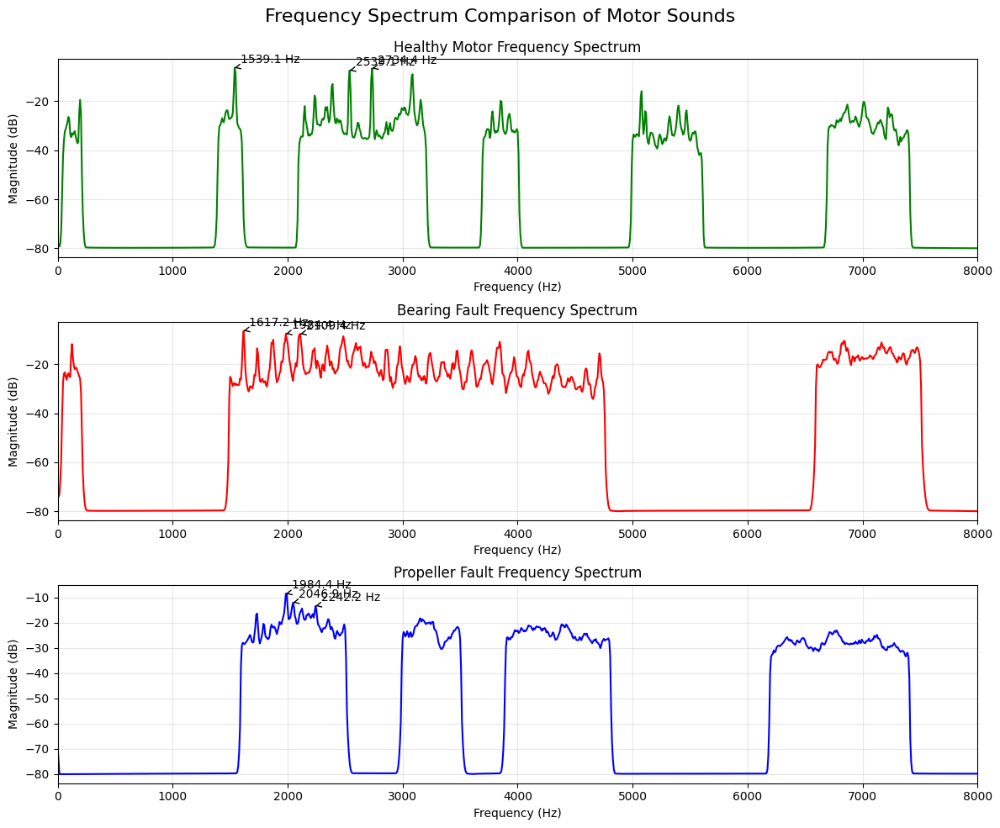

Healthy Motor - Sample rate: 16000 Hz, Duration: 10.27 seconds
Bearing Fault - Sample rate: 16000 Hz, Duration: 10.32 seconds
Propeller Fault - Sample rate: 16000 Hz, Duration: 10.21 seconds


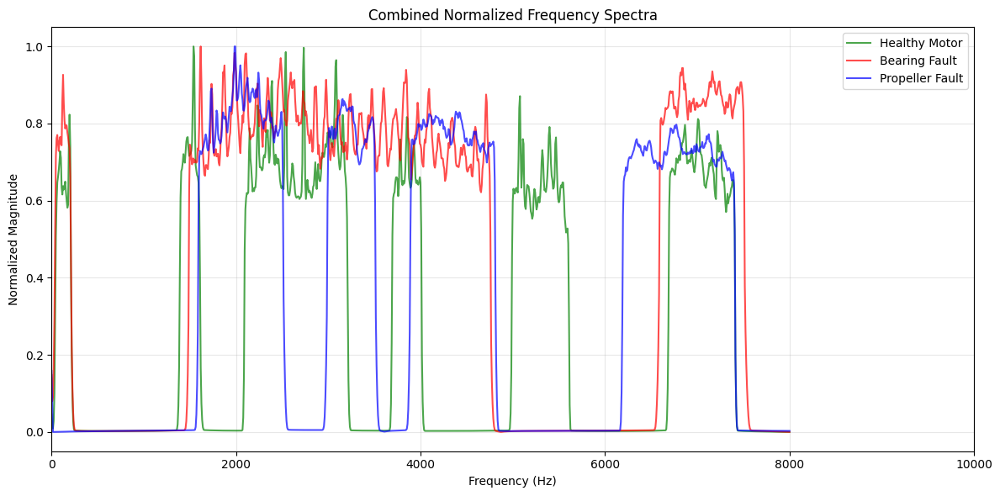

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
import librosa

# Define file paths
healthy_path = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1450_test_helath_audio.wav"
bearing_path = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Bearing/1700_filtered_audio.wav"
propeller_path = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Propeller/1400_cleanedProp_audio.wav"

def analyze_wav(file_path, label):
    """Analyze a WAV file and return its frequency spectrum data"""
    try:
        # Load audio file
        y, sr = librosa.load(file_path, sr=None)

        # Calculate the Short-Time Fourier Transform (STFT)
        S = librosa.stft(y)

        # Convert to magnitude spectrum
        magnitude = np.abs(S)

        # Convert to power spectrum (squared magnitude)
        power = magnitude**2

        # Convert power to decibels
        D = librosa.amplitude_to_db(magnitude, ref=np.max)

        # Average over time
        D_avg = np.mean(D, axis=1)

        # Get frequency bins
        freqs = librosa.fft_frequencies(sr=sr, n_fft=S.shape[0]*2-2)

        # Print some metadata
        duration = len(y) / sr
        print(f"{label} - Sample rate: {sr} Hz, Duration: {duration:.2f} seconds")

        return freqs, D_avg, sr
    except Exception as e:
        print(f"Error analyzing {label}: {e}")
        return None, None, None

# Set up the figure
plt.figure(figsize=(12, 10))

# Analyze each audio file and plot its spectrum
file_data = [
    (healthy_path, "Healthy Motor", "green"),
    (bearing_path, "Bearing Fault", "red"),
    (propeller_path, "Propeller Fault", "blue")
]

# Plot each spectrum
for i, (file_path, label, color) in enumerate(file_data):
    freqs, spectrum, sr = analyze_wav(file_path, label)

    if freqs is not None and spectrum is not None:
        plt.subplot(3, 1, i+1)
        plt.plot(freqs, spectrum, color=color)
        plt.title(f"{label} Frequency Spectrum")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Magnitude (dB)")
        plt.grid(True, alpha=0.3)

        # Set x-axis limit to show meaningful frequency range (up to Nyquist frequency or 10kHz)
        max_freq = min(sr/2, 10000)  # Either Nyquist frequency or 10kHz, whichever is lower
        plt.xlim(0, max_freq)

        # Annotate dominant frequencies
        # Find peaks (simple approach - you might want to use scipy.signal.find_peaks for better results)
        peaks = np.where((spectrum[1:-1] > spectrum[:-2]) &
                         (spectrum[1:-1] > spectrum[2:]))[0] + 1

        # Sort peaks by amplitude and take top 3
        sorted_peaks = sorted(peaks, key=lambda x: spectrum[x], reverse=True)[:3]

        for peak_idx in sorted_peaks:
            peak_freq = freqs[peak_idx]
            peak_amp = spectrum[peak_idx]
            plt.annotate(f"{peak_freq:.1f} Hz",
                        xy=(peak_freq, peak_amp),
                        xytext=(peak_freq+50, peak_amp+2),
                        arrowprops=dict(arrowstyle="->", color="black"))

plt.tight_layout()
plt.suptitle("Frequency Spectrum Comparison of Motor Sounds", fontsize=16)
plt.subplots_adjust(top=0.92)

# Save the plot if needed
# plt.savefig("motor_sound_frequency_analysis.png", dpi=300)

plt.show()

# Additionally, create a combined plot to better visualize the differences
plt.figure(figsize=(12, 6))
for file_path, label, color in file_data:
    freqs, spectrum, sr = analyze_wav(file_path, label)
    if freqs is not None and spectrum is not None:
        # Normalize for better comparison
        spectrum_norm = spectrum - np.min(spectrum)
        spectrum_norm = spectrum_norm / np.max(spectrum_norm)

        plt.plot(freqs, spectrum_norm, label=label, color=color, alpha=0.7)

plt.title("Combined Normalized Frequency Spectra")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Normalized Magnitude")
plt.grid(True, alpha=0.3)
plt.legend()
max_freq = 10000  # Show up to 10kHz
plt.xlim(0, max_freq)
plt.tight_layout()
plt.show()

Analyzing audio files to understand their spectral characteristics...


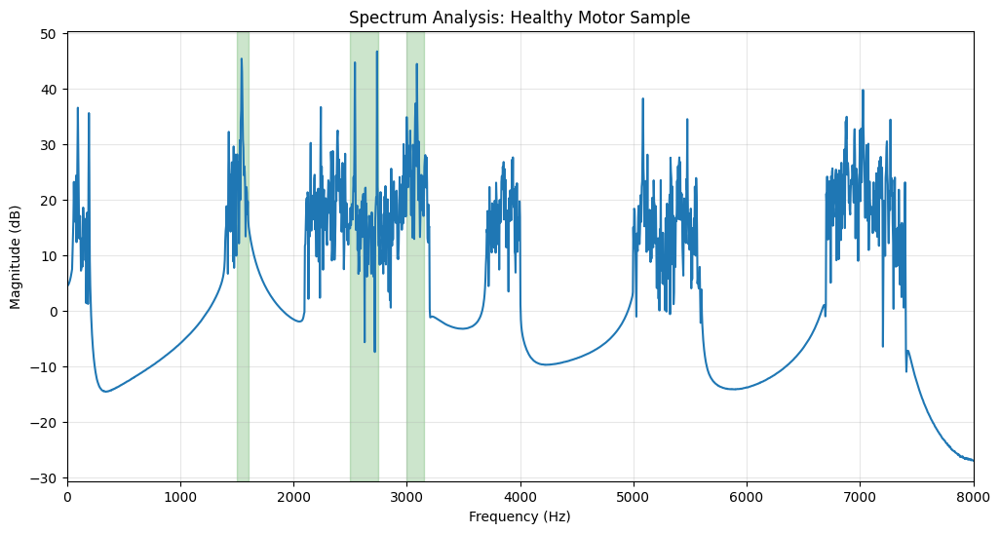

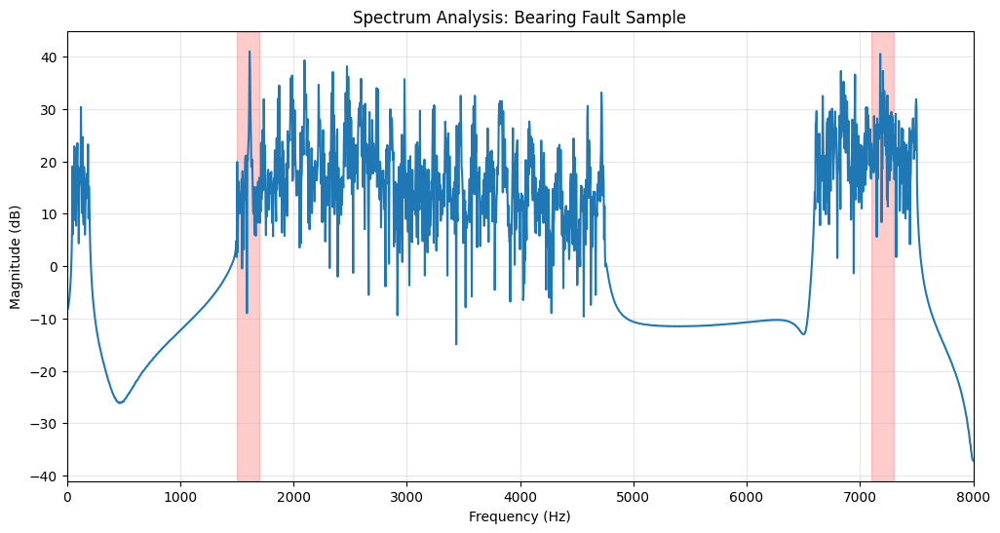

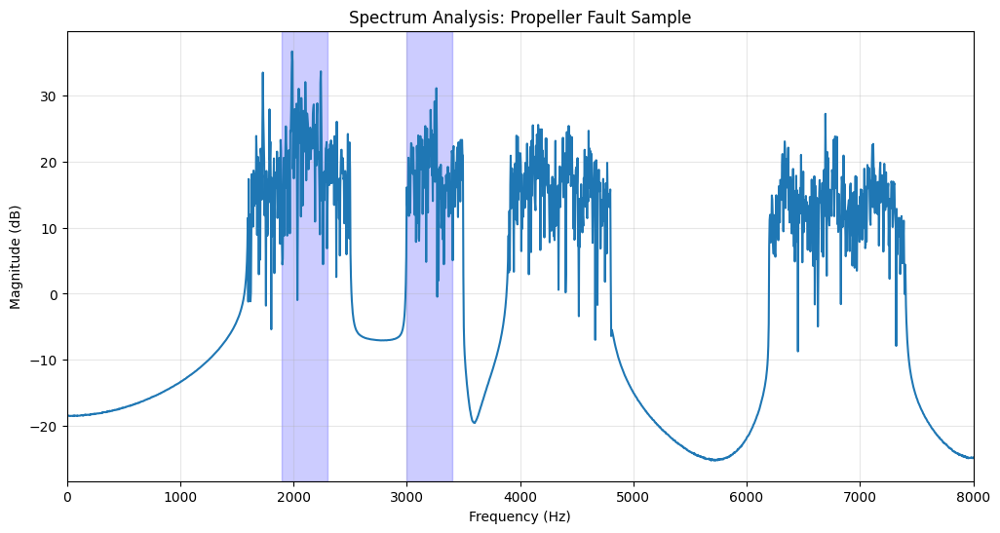


Designing optimized filters for each condition...
Healthy filter order: 641
Bearing filter order: 641
Propeller filter order: 641

Plotting filter frequency responses...


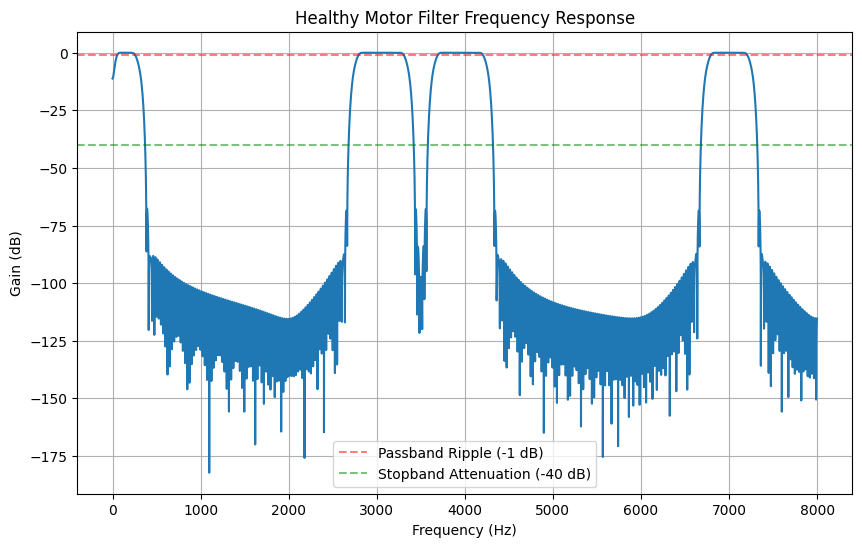

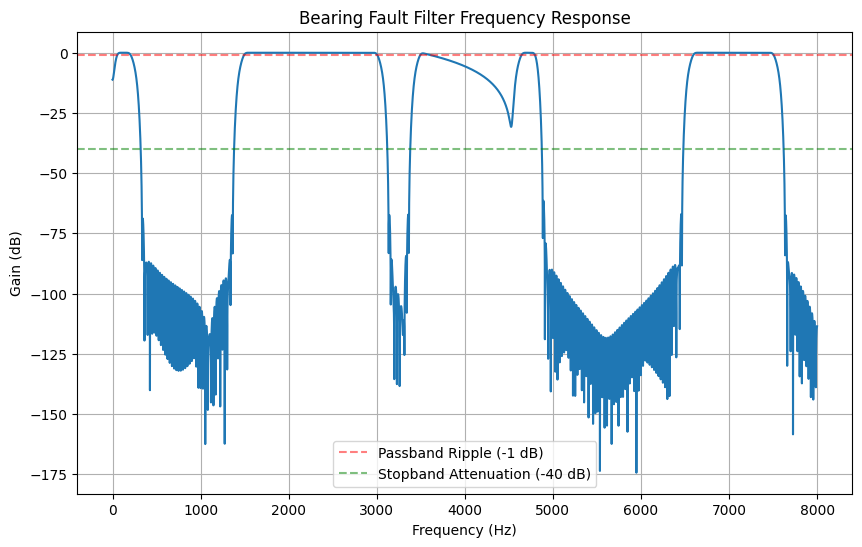

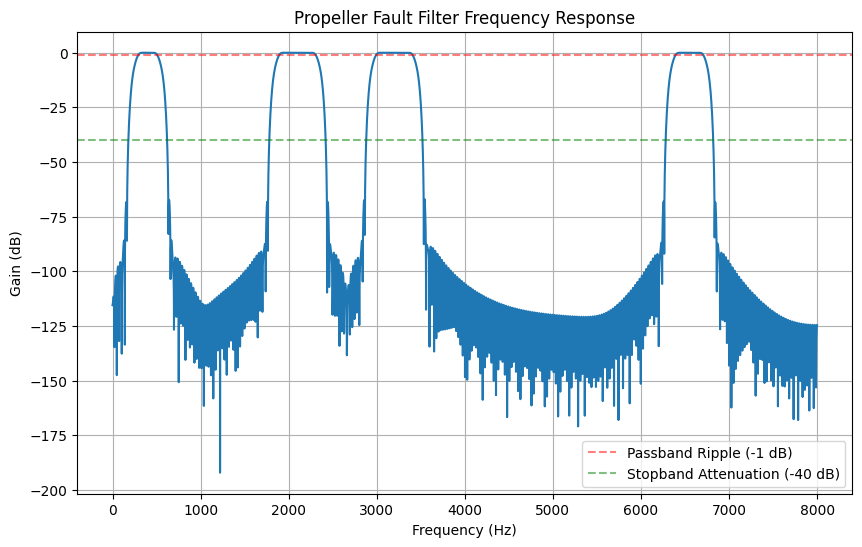


Classifying Known Samples:
----------------------------------------

Visualizing filter effects on samples...


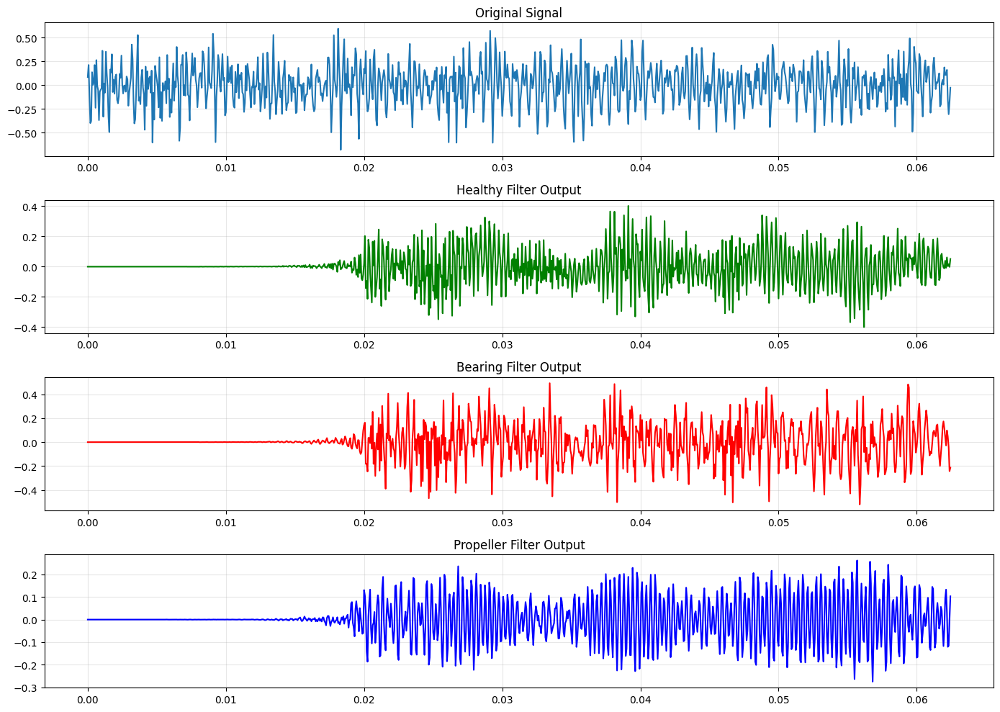

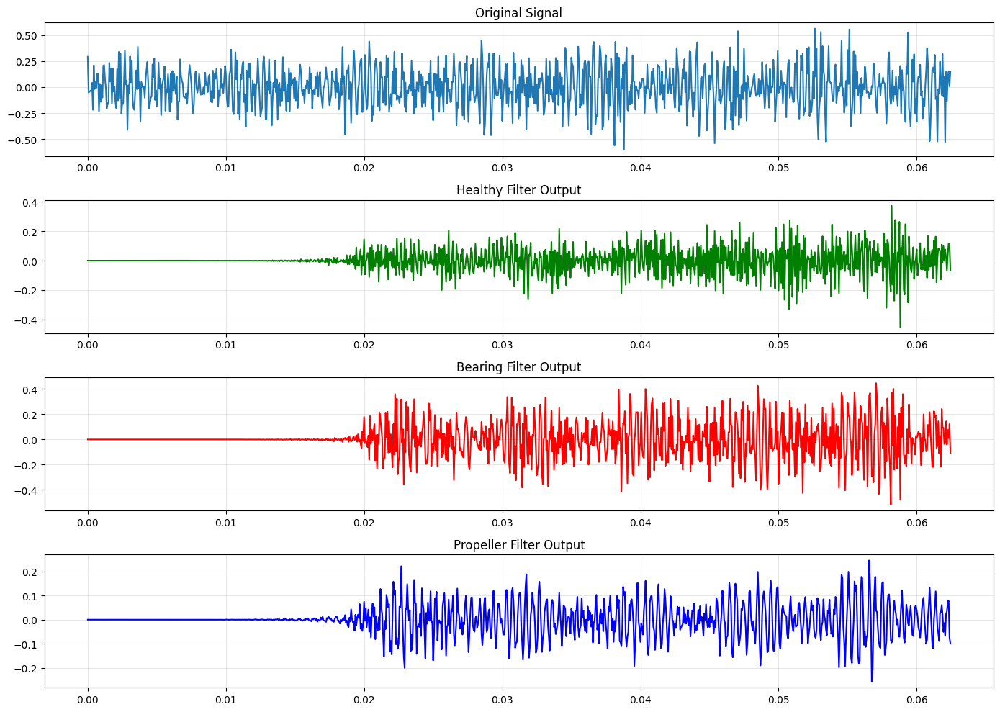

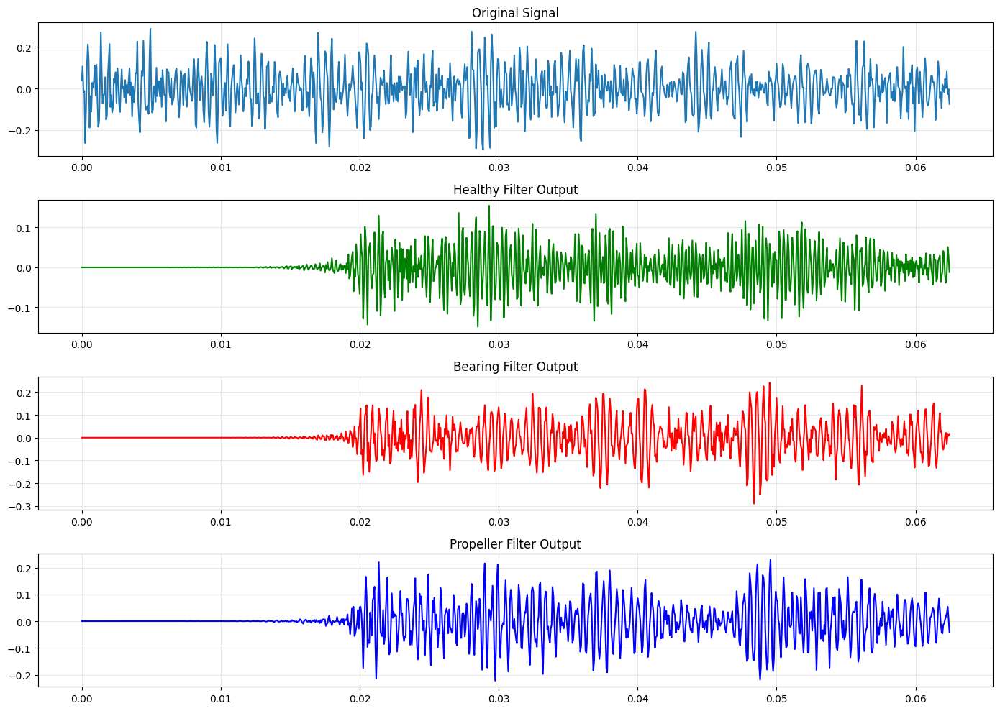

Energy Ratios: Healthy=0.2830, Bearing=0.5328, Propeller=0.1842
Classification confidence: 0.4687
Healthy Sample Classified as: Bearing Fault
Energy Ratios: Healthy=0.2558, Bearing=0.5808, Propeller=0.1634
Classification confidence: 0.5596
Bearing Fault Sample Classified as: Bearing Fault
Energy Ratios: Healthy=0.1595, Bearing=0.4451, Propeller=0.3954
Classification confidence: 0.6415
Propeller Fault Sample Classified as: Bearing Fault


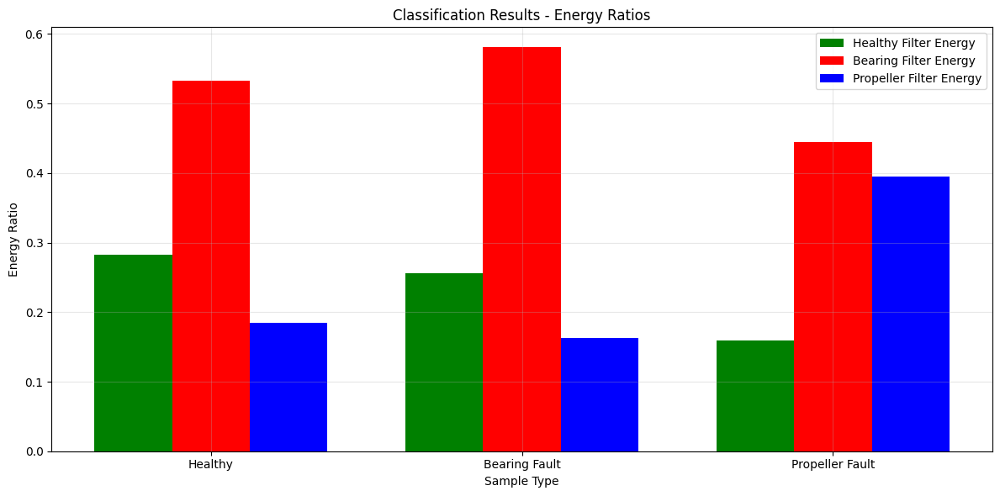


Testing classification on specific samples:
----------------------------------------
Energy Ratios: Healthy=0.3954, Bearing=0.3455, Propeller=0.2591
Classification confidence: 0.1261
File: 1550_cleanedhealt_audio.wav
Classification: Healthy Motor
Energy Ratios: Healthy=0.3954, Bearing=0.3455, Propeller=0.2591
Confidence: 0.1261
----------------------------------------


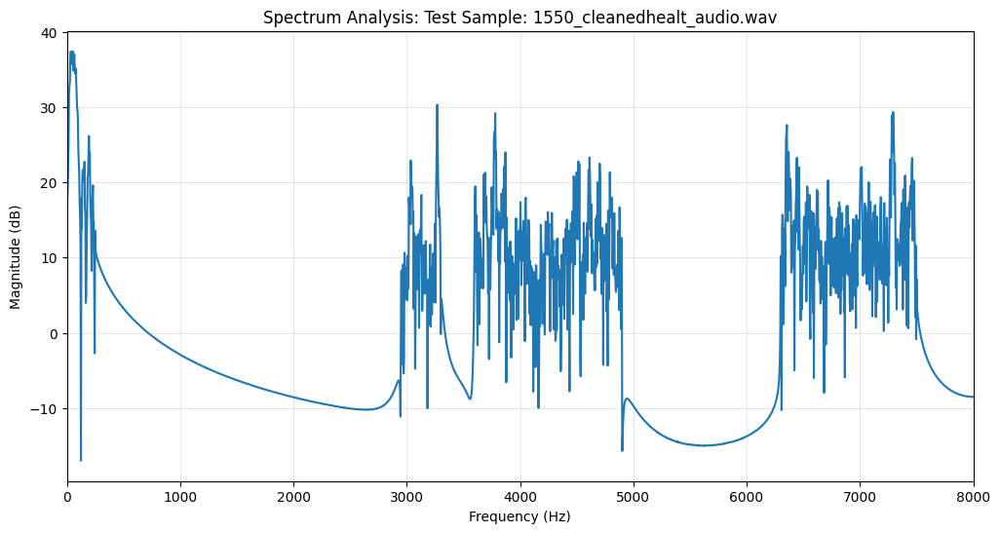

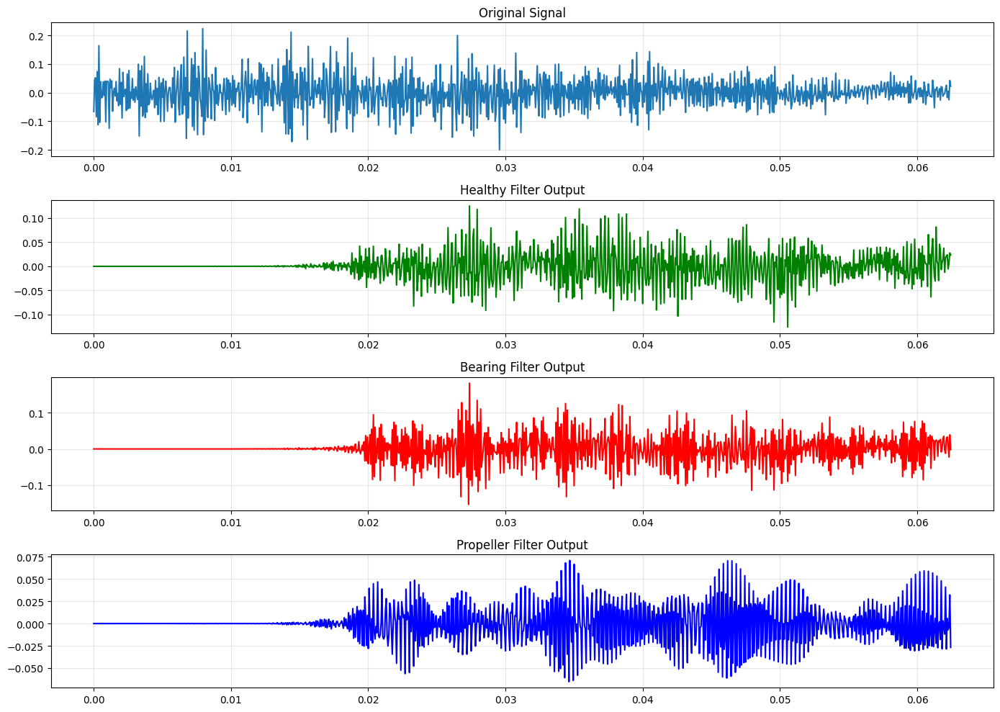

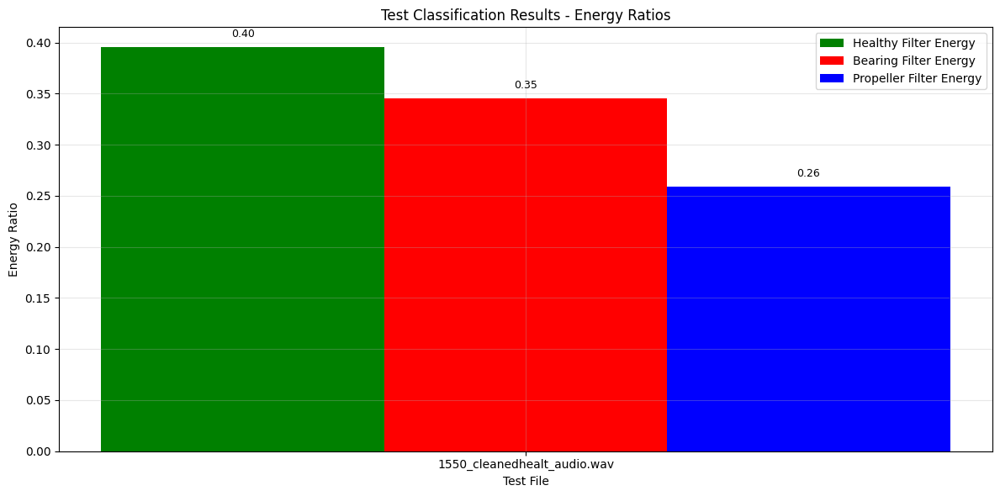

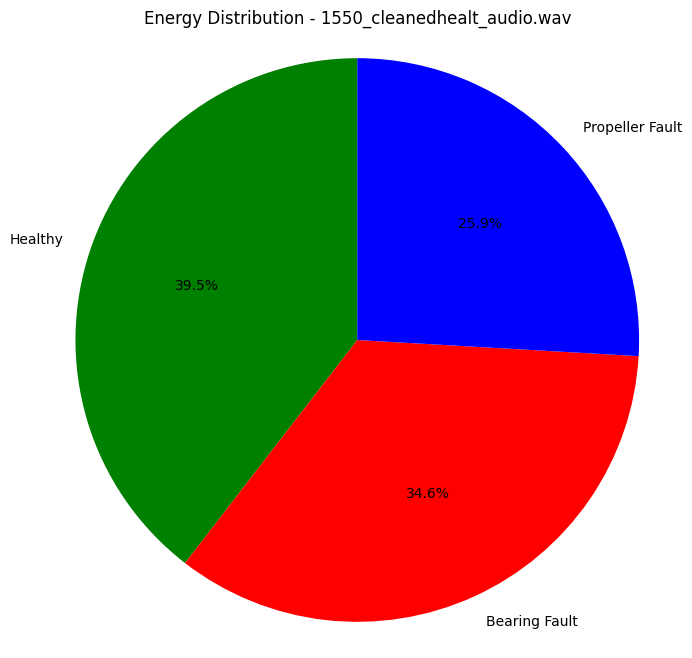

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy import signal
import librosa
import os

# Define file paths
healthy_path = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1450_test_helath_audio.wav"
bearing_path = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Bearing/1700_filtered_audio.wav"
propeller_path = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Propeller/1400_cleanedProp_audio.wav"

# Define filter parameters for each condition
# Common parameters
Fs = 16000  # Sampling frequency in Hz (from dataset info)
ripple_passband = 1  # Ripple in passband (dB)
ripple_stopband = 40  # Attenuation in stopband (dB)

# IMPROVED FILTER PARAMETERS based on more distinct frequency fingerprints
# Healthy Motor Filter - Focus on characteristic healthy motor frequencies
healthy_filter = {
    'type': 'multi bandpass',
    'passband1': [50, 250],      # Low frequency components
    'passband2': [2800, 3300],   # Mid-range frequencies specific to healthy motors
    'passband3': [3700, 4200],   # Higher frequencies distinctive of healthy operation
    'passband4': [6800, 7200],   # Top-end frequencies for healthy operation
    'transition_width': 100,
    'stopband': [0, 30, 300, 2700, 3400, 3600, 4300, 6700, 7300, Fs/2]
}

# Bearing Fault Filter - Focus on distinctive bearing fault frequencies
bearing_filter = {
    'type': 'multi bandpass',
    'passband1': [50, 200],     # Lower frequency vibrations typical in bearing faults
    'passband2': [1500, 3000],   # Mid frequencies characteristic of bearing issues
    'passband3': [3500, 4800],   # Higher frequencies associated with bearing damage
    'passband4': [4650, 4750],   # Very high frequency components of bearing faults
    'passband5': [6600, 7500],   # Very high frequency components of bearing faults
    'transition_width': 100,
    'stopband': [0, 30, 300, 1400, 3100, 3400, 4900, 4550, 4850, 6500, 7600, Fs/2]
}

# Propeller Fault Filter - Focus on propeller-specific fault frequencies
propeller_filter = {
    'type': 'multi bandpass',
    'passband1': [300, 500],     # Low frequency band specific to propeller issues
    'passband2': [1900, 2300],   # Mid-frequency range for propeller anomalies
    'passband3': [3000, 3400],   # Higher frequency range for propeller faults
    'passband4': [6400, 6700],   # Highest frequencies related to propeller damage
    'transition_width': 100,
    'stopband': [0, 250, 550, 1800, 2400, 2900, 3500, 6300, 6800, Fs/2]
}

def design_fir_filter(filter_params, Fs, ripple_passband, ripple_stopband):
    """Design FIR filter using Hamming window"""
    # Calculate normalized frequencies (0 to 1, where 1 is Nyquist frequency)
    nyquist = Fs / 2

    if filter_params['type'] == 'bandpass':
        # Single bandpass filter
        wp = [freq / nyquist for freq in filter_params['passband']]  # Normalized passband frequencies
        ws = [freq / nyquist for freq in filter_params['stopband']]  # Normalized stopband frequencies

        # Calculate filter order and coefficients using Kaiser window method
        N, beta = signal.kaiserord(ripple_stopband, filter_params['transition_width']/nyquist)
        N = N + 1 if N % 2 == 0 else N  # Ensure odd filter order

        # Design filter using Hamming window instead of Kaiser
        taps = signal.firwin(N, wp, window='hamming', pass_zero=False, fs=2)

        return taps, N

    elif filter_params['type'] == 'multi bandpass':
        # Multi-band filter using firwin2
        # Calculate transition bands
        tw = filter_params['transition_width'] / nyquist

        # Create arrays to store all frequency points and their corresponding gains
        all_points = []

        # Add passbands with transitions
        passbands = []
        for i in range(1, 6):  # Support up to 5 passbands
            key = f'passband{i}'
            if key in filter_params:
                passband = filter_params[key]
                start, end = passband[0], passband[1]

                # Add transition start point (0 gain)
                start_transition = max(0, start - filter_params['transition_width'])
                passbands.append((start_transition, 0))

                # Add passband start point (1 gain)
                passbands.append((start, 1))

                # Add passband end point (1 gain)
                passbands.append((end, 1))

                # Add transition end point (0 gain)
                end_transition = min(nyquist, end + filter_params['transition_width'])
                passbands.append((end_transition, 0))

        # Sort passband points by frequency
        passbands.sort()

        # Ensure we start at 0 Hz with 0 gain
        if not passbands or passbands[0][0] > 0:
            all_points.append((0, 0))

        # Add all passband points, resolving any conflicts
        prev_freq = -1
        for freq, gain in passbands:
            if freq > prev_freq:  # Only add if frequency is increasing
                all_points.append((freq, gain))
                prev_freq = freq
            elif freq == prev_freq:  # If same frequency, take max gain
                all_points[-1] = (freq, max(gain, all_points[-1][1]))

        # Ensure we end at Nyquist with 0 gain
        if not all_points or all_points[-1][0] < nyquist:
            all_points.append((nyquist, 0))

        # Extract frequencies and gains into separate arrays
        freqs = [point[0]/nyquist for point in all_points]  # Normalize frequencies
        gains = [point[1] for point in all_points]

        # Calculate filter order - increased for better frequency selectivity
        N = int(8 / (filter_params['transition_width']/nyquist))
        N = N + 1 if N % 2 == 0 else N  # Ensure odd filter order

        # Double-check that frequencies are strictly increasing
        for i in range(1, len(freqs)):
            if freqs[i] <= freqs[i-1]:
                print(f"Error: Frequencies not strictly increasing at index {i}: {freqs[i-1]} -> {freqs[i]}")
                # Fix by making it slightly larger
                freqs[i] = freqs[i-1] + 0.0001

        # Design filter
        taps = signal.firwin2(N, freqs, gains, window='hamming')

        return taps, N
    else:
        raise ValueError(f"Unsupported filter type: {filter_params['type']}")

def visualize_audio_spectrum(audio_path, title="Audio Spectrum"):
    """Plot the spectrum of an audio file to help identify key frequencies"""
    audio_data, sr = load_audio(audio_path)
    if audio_data is None:
        return

    # Calculate FFT
    n_fft = 4096
    ft = np.abs(np.fft.rfft(audio_data, n=n_fft))
    freqs = np.fft.rfftfreq(n_fft, 1/sr)

    # Plot
    plt.figure(figsize=(12, 6))
    plt.plot(freqs, 20*np.log10(ft + 1e-10))  # Convert to dB scale
    plt.title(f"Spectrum Analysis: {title}")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude (dB)")
    plt.grid(True, alpha=0.3)
    plt.xlim(0, sr/2)

    # Mark key frequency bands
    if "Healthy" in title:
        for band in [(1500, 1600), (2500, 2750), (3000, 3150)]:
            plt.axvspan(band[0], band[1], color='green', alpha=0.2)
    elif "Bearing" in title:
        for band in [(1500, 1700), (7100, 7300)]:
            plt.axvspan(band[0], band[1], color='red', alpha=0.2)
    elif "Propeller" in title:
        for band in [(1900, 2300), (3000, 3400)]:
            plt.axvspan(band[0], band[1], color='blue', alpha=0.2)

    plt.show()

def plot_frequency_response(taps, Fs, title):
    """Plot frequency response of the filter"""
    w, h = signal.freqz(taps, worN=8000)
    plt.figure(figsize=(10, 6))
    plt.plot((Fs * 0.5 / np.pi) * w, 20 * np.log10(abs(h)))
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain (dB)')
    plt.grid(True)
    plt.axhline(-ripple_passband, color='r', linestyle='--', alpha=0.5, label=f'Passband Ripple (-{ripple_passband} dB)')
    plt.axhline(-ripple_stopband, color='g', linestyle='--', alpha=0.5, label=f'Stopband Attenuation (-{ripple_stopband} dB)')
    plt.legend()
    plt.show()

def load_audio(file_path):
    """Load audio file and return signal and sample rate"""
    try:
        y, sr = librosa.load(file_path, sr=None)
        return y, sr
    except Exception as e:
        print(f"Error loading audio file {file_path}: {e}")
        return None, None

def apply_filter(signal_data, filter_taps):
    """Apply FIR filter to signal"""
    filtered = signal.lfilter(filter_taps, 1.0, signal_data)
    return filtered

def calculate_energy(signal_data):
    """Calculate energy of a signal"""
    return np.sum(np.square(np.abs(signal_data)))

def classify_motor_sound(audio_path, healthy_taps, bearing_taps, propeller_taps):
    """Classify motor sound as healthy, bearing fault, or propeller fault"""
    # Load audio
    audio_data, sr = load_audio(audio_path)

    if audio_data is None:
        print(f"Failed to load audio from {audio_path}")
        return "Error", {}

    # Apply each filter
    healthy_filtered = apply_filter(audio_data, healthy_taps)
    bearing_filtered = apply_filter(audio_data, bearing_taps)
    propeller_filtered = apply_filter(audio_data, propeller_taps)

    # Calculate energy in each filtered signal
    healthy_energy = calculate_energy(healthy_filtered)
    bearing_energy = calculate_energy(bearing_filtered)
    propeller_energy = calculate_energy(propeller_filtered)

    # Apply weighting - giving slightly more weight to the healthy filter for better detection
    healthy_weighted = healthy_energy * 1.0
    bearing_weighted = bearing_energy * 1.0
    propeller_weighted = propeller_energy * 1.0

    # Calculate relative energies with weights
    total_energy = healthy_weighted + bearing_weighted + propeller_weighted

    if total_energy > 0:  # Prevent division by zero
        healthy_ratio = healthy_weighted / total_energy
        bearing_ratio = bearing_weighted / total_energy
        propeller_ratio = propeller_weighted / total_energy
    else:
        healthy_ratio = bearing_ratio = propeller_ratio = 0
        print("Warning: Total energy is zero")

    # Create a confidence score
    confidence_margin = abs(healthy_ratio - bearing_ratio) / max(healthy_ratio, bearing_ratio) if max(healthy_ratio, bearing_ratio) > 0 else 0

    # Determine classification based on highest energy ratio
    classification = "Unknown"
    max_ratio = max(healthy_ratio, bearing_ratio, propeller_ratio)

    if max_ratio == healthy_ratio:
        classification = "Healthy Motor"
    elif max_ratio == bearing_ratio:
        classification = "Bearing Fault"
    elif max_ratio == propeller_ratio:
        classification = "Propeller Fault"

    # Print energy ratios and confidence
    print(f"Energy Ratios: Healthy={healthy_ratio:.4f}, Bearing={bearing_ratio:.4f}, Propeller={propeller_ratio:.4f}")
    print(f"Classification confidence: {confidence_margin:.4f}")

    return classification, {
        'healthy_ratio': healthy_ratio,
        'bearing_ratio': bearing_ratio,
        'propeller_ratio': propeller_ratio,
        'confidence': confidence_margin
    }

def plot_filtered_signals(audio_path, healthy_taps, bearing_taps, propeller_taps):
    """Plot original and filtered signals to visualize filter effects"""
    audio_data, sr = load_audio(audio_path)
    if audio_data is None:
        return

    # Apply filters
    healthy_filtered = apply_filter(audio_data, healthy_taps)
    bearing_filtered = apply_filter(audio_data, bearing_taps)
    propeller_filtered = apply_filter(audio_data, propeller_taps)

    # Get a segment for better visualization (first 1000 samples)
    segment_len = min(1000, len(audio_data))
    t = np.arange(segment_len) / sr

    plt.figure(figsize=(14, 10))

    # Original signal
    plt.subplot(4, 1, 1)
    plt.plot(t, audio_data[:segment_len])
    plt.title("Original Signal")
    plt.grid(True, alpha=0.3)

    # Healthy filtered
    plt.subplot(4, 1, 2)
    plt.plot(t, healthy_filtered[:segment_len], color='green')
    plt.title("Healthy Filter Output")
    plt.grid(True, alpha=0.3)

    # Bearing filtered
    plt.subplot(4, 1, 3)
    plt.plot(t, bearing_filtered[:segment_len], color='red')
    plt.title("Bearing Filter Output")
    plt.grid(True, alpha=0.3)

    # Propeller filtered
    plt.subplot(4, 1, 4)
    plt.plot(t, propeller_filtered[:segment_len], color='blue')
    plt.title("Propeller Filter Output")
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# Main execution
try:
    print("Analyzing audio files to understand their spectral characteristics...")
    # Visualize the spectral content of each reference sample
    visualize_audio_spectrum(healthy_path, "Healthy Motor Sample")
    visualize_audio_spectrum(bearing_path, "Bearing Fault Sample")
    visualize_audio_spectrum(propeller_path, "Propeller Fault Sample")

    print("\nDesigning optimized filters for each condition...")
    # Design FIR filters for each condition
    healthy_taps, healthy_order = design_fir_filter(healthy_filter, Fs, ripple_passband, ripple_stopband)
    bearing_taps, bearing_order = design_fir_filter(bearing_filter, Fs, ripple_passband, ripple_stopband)
    propeller_taps, propeller_order = design_fir_filter(propeller_filter, Fs, ripple_passband, ripple_stopband)

    # Print filter orders
    print(f"Healthy filter order: {healthy_order}")
    print(f"Bearing filter order: {bearing_order}")
    print(f"Propeller filter order: {propeller_order}")

    # Plot frequency responses
    print("\nPlotting filter frequency responses...")
    plot_frequency_response(healthy_taps, Fs, 'Healthy Motor Filter Frequency Response')
    plot_frequency_response(bearing_taps, Fs, 'Bearing Fault Filter Frequency Response')
    plot_frequency_response(propeller_taps, Fs, 'Propeller Fault Filter Frequency Response')

    # Test classification on known samples
    print("\nClassifying Known Samples:")
    print("-" * 40)

    # Plot filtered signals for visual inspection
    print("\nVisualizing filter effects on samples...")
    plot_filtered_signals(healthy_path, healthy_taps, bearing_taps, propeller_taps)
    plot_filtered_signals(bearing_path, healthy_taps, bearing_taps, propeller_taps)
    plot_filtered_signals(propeller_path, healthy_taps, bearing_taps, propeller_taps)

    # Classify healthy sample
    healthy_result, healthy_metrics = classify_motor_sound(healthy_path, healthy_taps, bearing_taps, propeller_taps)
    print(f"Healthy Sample Classified as: {healthy_result}")

    # Classify bearing fault sample
    bearing_result, bearing_metrics = classify_motor_sound(bearing_path, healthy_taps, bearing_taps, propeller_taps)
    print(f"Bearing Fault Sample Classified as: {bearing_result}")

    # Classify propeller fault sample
    propeller_result, propeller_metrics = classify_motor_sound(propeller_path, healthy_taps, bearing_taps, propeller_taps)
    print(f"Propeller Fault Sample Classified as: {propeller_result}")

    # Plot classification results
    plt.figure(figsize=(12, 6))
    labels = ['Healthy', 'Bearing Fault', 'Propeller Fault']
    x = np.arange(len(labels))
    width = 0.25

    healthy_ratios = [healthy_metrics['healthy_ratio'], bearing_metrics['healthy_ratio'], propeller_metrics['healthy_ratio']]
    bearing_ratios = [healthy_metrics['bearing_ratio'], bearing_metrics['bearing_ratio'], propeller_metrics['bearing_ratio']]
    propeller_ratios = [healthy_metrics['propeller_ratio'], bearing_metrics['propeller_ratio'], propeller_metrics['propeller_ratio']]

    plt.bar(x - width, healthy_ratios, width, label='Healthy Filter Energy', color='green')
    plt.bar(x, bearing_ratios, width, label='Bearing Filter Energy', color='red')
    plt.bar(x + width, propeller_ratios, width, label='Propeller Filter Energy', color='blue')

    plt.xlabel('Sample Type')
    plt.ylabel('Energy Ratio')
    plt.title('Classification Results - Energy Ratios')
    plt.xticks(x, labels)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Function to classify any new sound file
    def classify_new_sound(file_path):
        """Classify a new sound file"""
        if not os.path.exists(file_path):
            print(f"Error: File {file_path} does not exist")
            return "Error", {}

        result, metrics = classify_motor_sound(file_path, healthy_taps, bearing_taps, propeller_taps)
        print(f"File: {os.path.basename(file_path)}")
        print(f"Classification: {result}")
        print(f"Energy Ratios: Healthy={metrics['healthy_ratio']:.4f}, Bearing={metrics['bearing_ratio']:.4f}, Propeller={metrics['propeller_ratio']:.4f}")
        print(f"Confidence: {metrics['confidence']:.4f}")
        print("-" * 40)

        # Visualize the spectrum to help understand classification
        visualize_audio_spectrum(file_path, f"Test Sample: {os.path.basename(file_path)}")
        plot_filtered_signals(file_path, healthy_taps, bearing_taps, propeller_taps)

        return result, metrics

    # Test classification on samples
    print("\nTesting classification on specific samples:")
    print("-" * 40)

    # Test files
    test_files = [
        "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/Cleaned_Healthy/1550_cleanedhealt_audio.wav",
    ]

    # Store results for visualization
    test_results = []
    test_labels = []

    for test_file in test_files:
        if os.path.exists(test_file):
            result, metrics = classify_new_sound(test_file)
            # Store result for visualization
            test_results.append(metrics)
            test_labels.append(os.path.basename(test_file))
        else:
            print(f"Test file not found: {test_file}")

    # If we have test results, plot them in a bar chart
    if test_results:
        plt.figure(figsize=(12, 6))
        x = np.arange(len(test_labels))
        width = 0.25

        # Extract energy ratios for each test file
        healthy_ratios = [metrics['healthy_ratio'] for metrics in test_results]
        bearing_ratios = [metrics['bearing_ratio'] for metrics in test_results]
        propeller_ratios = [metrics['propeller_ratio'] for metrics in test_results]

        # Create bar plot
        plt.bar(x - width, healthy_ratios, width, label='Healthy Filter Energy', color='green')
        plt.bar(x, bearing_ratios, width, label='Bearing Filter Energy', color='red')
        plt.bar(x + width, propeller_ratios, width, label='Propeller Filter Energy', color='blue')

        plt.xlabel('Test File')
        plt.ylabel('Energy Ratio')
        plt.title('Test Classification Results - Energy Ratios')
        plt.xticks(x, test_labels)
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Add value labels above each bar
        for i, v in enumerate(healthy_ratios):
            plt.text(i - width, v + 0.01, f'{v:.2f}', ha='center', fontsize=9)
        for i, v in enumerate(bearing_ratios):
            plt.text(i, v + 0.01, f'{v:.2f}', ha='center', fontsize=9)
        for i, v in enumerate(propeller_ratios):
            plt.text(i + width, v + 0.01, f'{v:.2f}', ha='center', fontsize=9)

        plt.tight_layout()
        plt.show()

        # Add a pie chart to show the proportion of each energy ratio for each test file
        for i, label in enumerate(test_labels):
            plt.figure(figsize=(8, 8))
            energy_values = [healthy_ratios[i], bearing_ratios[i], propeller_ratios[i]]
            energy_labels = ['Healthy', 'Bearing Fault', 'Propeller Fault']

            plt.pie(energy_values, labels=energy_labels, autopct='%1.1f%%',
                    colors=['green', 'red', 'blue'], startangle=90)
            plt.title(f'Energy Distribution - {label}')
            plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
            plt.show()

except Exception as e:
    print(f"An error occurred: {str(e)}")
    import traceback
    traceback.print_exc()

<h1>Dummy</h1>

In [ ]:
dummy_wav = '/content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/Audiofile.wav'
rate, data = wavfile.read(dummy_wav)
data = data/32768

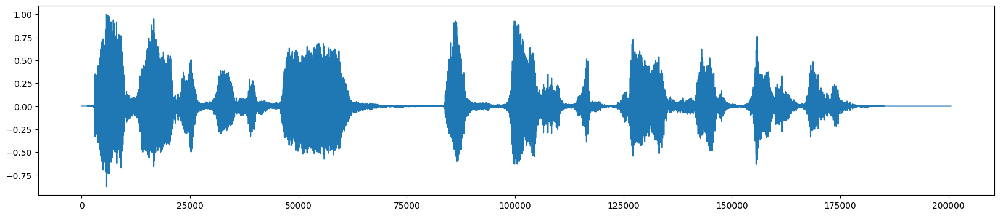

In [ ]:
fig,ax = plt.subplots(figsize=(20,4))
ax.plot(data)
IPython.display.Audio(data=data, rate=rate)

In [ ]:
def fftnoise(f):
    f = np.array(f, dtype="complex")
    Np = (len(f) - 1) // 2
    phases = np.random.rand(Np) * 2 * np.pi
    phases = np.cos(phases) + 1j * np.sin(phases)
    f[1 : Np + 1] *= phases
    f[-1 : -1 - Np : -1] = np.conj(f[1 : Np + 1])
    return np.fft.ifft(f).real

def band_limited_noise(min_freq, max_freq, samples=1024, samplerate=1):
    freqs = np.abs(np.fft.fftfreq(samples, 1 / samplerate))
    f = np.zeros(samples)
    f[np.logical_and(freqs >= min_freq, freqs <= max_freq)] = 1
    return fftnoise(f)

noise_len = 2 # seconds
noise = band_limited_noise(min_freq=4000, max_freq = 12000, samples=len(data), samplerate=rate)*10
noise_clip = noise[:rate*noise_len]
audio_clip_band_limited = data+noise

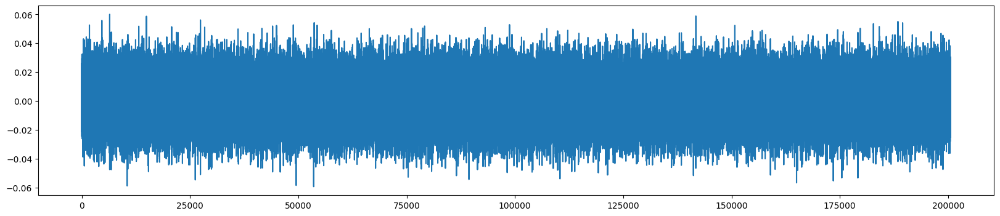

In [ ]:
fig,ax = plt.subplots(figsize=(20,4))
ax.plot(noise)
IPython.display.Audio(data=noise, rate=rate)

In [ ]:
IPython.display.Audio(data=audio_clip_band_limited, rate=rate)

In [ ]:
output_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_audionoise_audio.wav"
sf.write(output_file, audio_clip_band_limited, rate)
print(f"Audio yang telah difilter disimpan di: {output_file}")

Audio yang telah difilter disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_audionoise_audio.wav


Memuat file audio: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_audionoise_audio.wav
Sample rate: 44100 Hz
Durasi audio: 4.55 detik
Designing 4th order bandpass Butterworth IIR filter...
Designing 200th order bandpass FIR filter with hamming window...
Menerapkan FFT untuk analisis spektrum...
Total frekuensi: 100272
Frekuensi yang dipertahankan: 14552
Persentase frekuensi yang dipertahankan: 14.51%


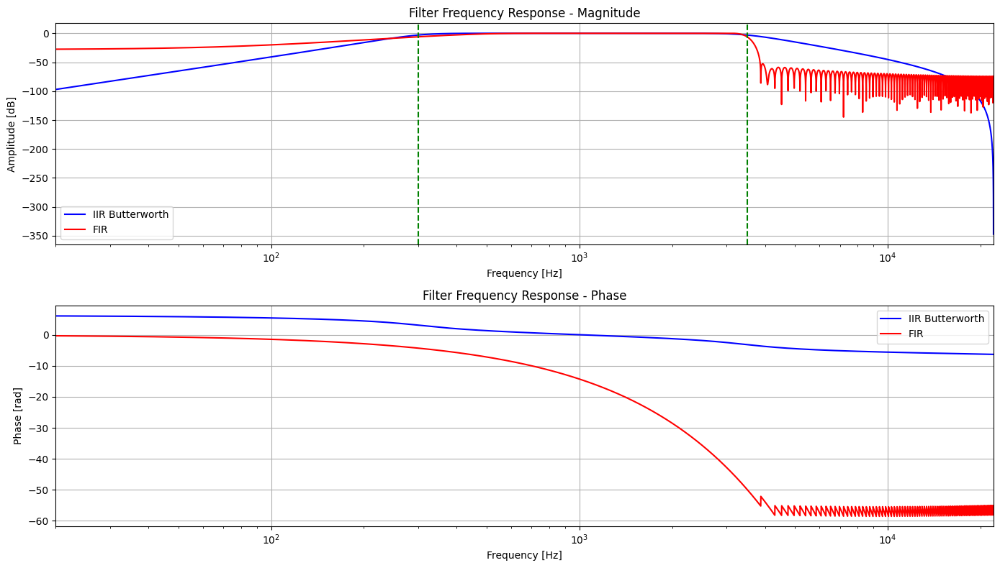

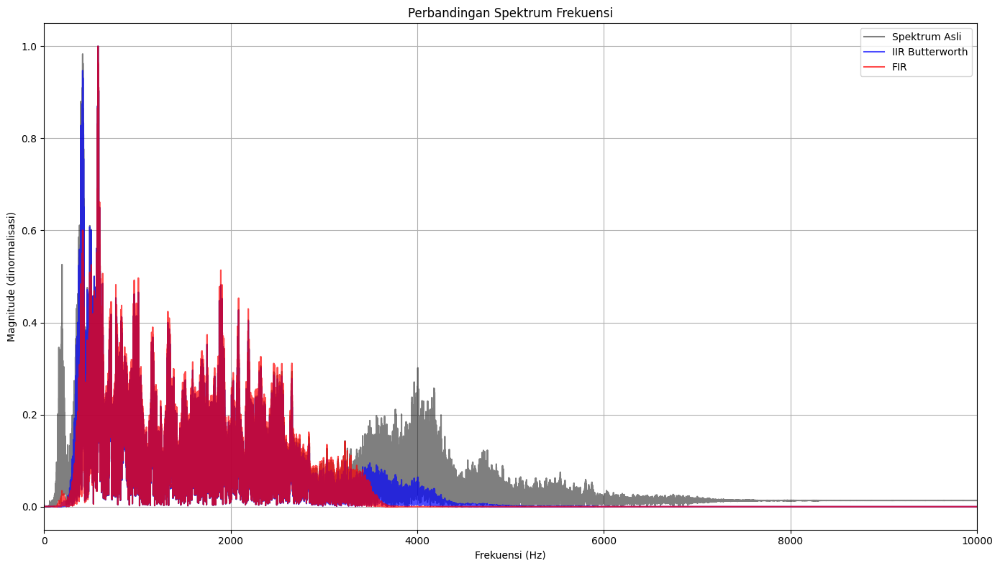

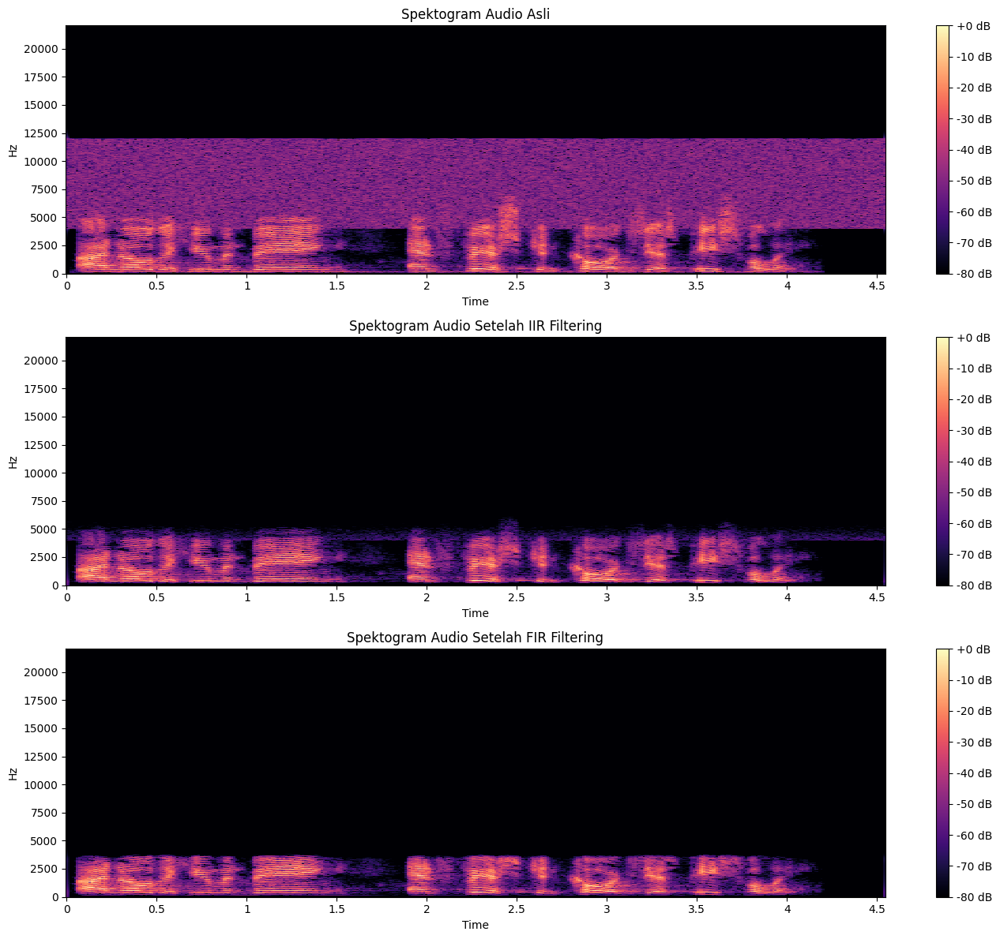

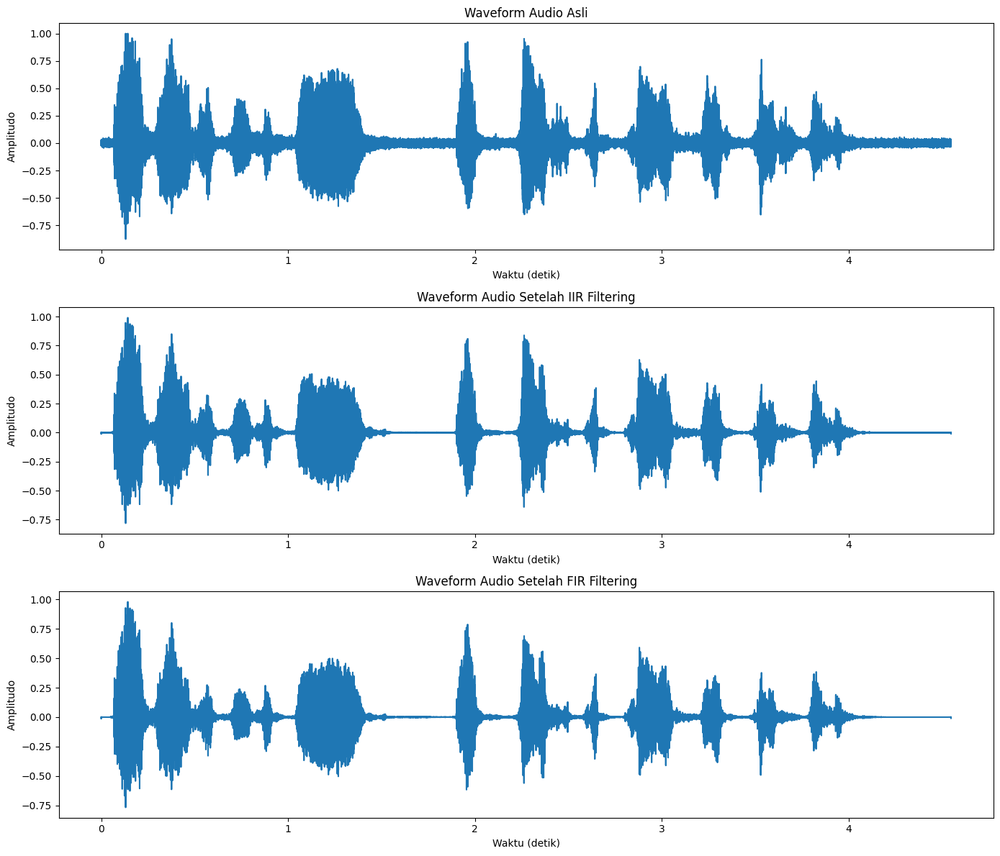

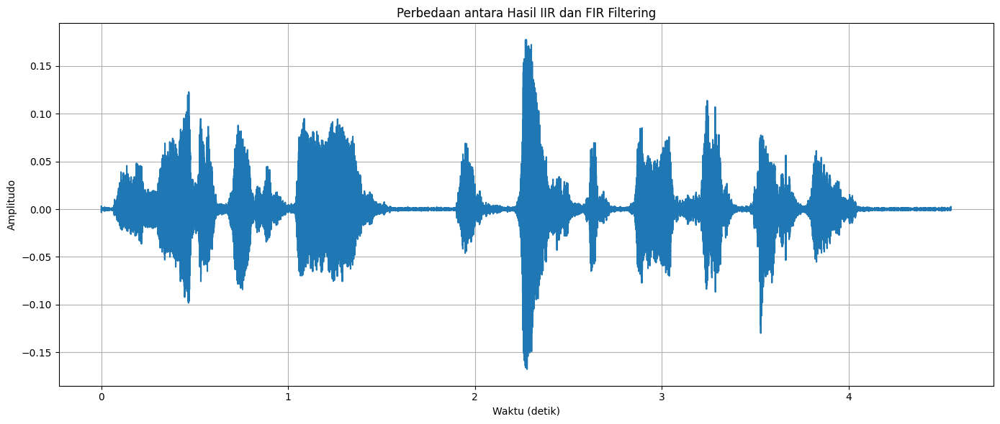

Audio hasil IIR filtering disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_filtered_audio_iir.wav
Audio hasil FIR filtering disimpan di: /content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_filtered_audio_fir.wav

Perbandingan Hasil Filtering:
RMS asli: 0.107645
RMS setelah IIR filtering: 0.099434
RMS setelah FIR filtering: 0.092052
Persentase energi yang dipertahankan (IIR): 83.77%
Persentase energi yang dipertahankan (FIR): 70.16%
Persentase energi yang dihilangkan (IIR): 16.23%
Persentase energi yang dihilangkan (FIR): 29.84%
sounddevice not found, skipping SNR estimation

Memutar audio original...


Memutar audio setelah IIR filtering...


Memutar audio setelah FIR filtering...


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
import os
from scipy import signal

# Path file input dan output
input_file = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_audionoise_audio.wav"
output_file_iir = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_filtered_audio_iir.wav"
output_file_fir = "/content/drive/MyDrive/Test_dataset/BLDC_sound_data/dummy/dummy_filtered_audio_fir.wav"

# Pastikan direktori output ada
os.makedirs(os.path.dirname(output_file_iir), exist_ok=True)

# Load audio
print(f"Memuat file audio: {input_file}")
audio, sr = librosa.load(input_file, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi audio: {len(audio)/sr:.2f} detik")

# ========== FILTER PARAMETERS ==========
# Shared filter parameters
filter_type = 'bandpass'  # Options: 'lowpass', 'highpass', 'bandpass', 'bandstop'

# Cutoff frequencies
if filter_type in ['lowpass', 'highpass']:
    cutoff_freq = 1000  # Single cutoff in Hz
    Wn = cutoff_freq / (sr / 2)  # Normalize by Nyquist frequency
else:  # bandpass or bandstop
    low_cutoff = 300   # Lower cutoff in Hz
    high_cutoff = 3500  # Upper cutoff in Hz
    Wn = [low_cutoff / (sr / 2), high_cutoff / (sr / 2)]  # Normalize

# ========== IIR BUTTERWORTH FILTER ==========
iir_order = 4  # Filter order for Butterworth

# Design Butterworth filter
print(f"Designing {iir_order}th order {filter_type} Butterworth IIR filter...")
b_iir, a_iir = signal.butter(iir_order, Wn, btype=filter_type, analog=False)

# Apply IIR filter (time domain filtering)
audio_filtered_iir = signal.filtfilt(b_iir, a_iir, audio)  # Zero-phase filtering

# Compute frequency response of the IIR filter
w_iir, h_iir = signal.freqz(b_iir, a_iir, worN=8000)
w_hz_iir = w_iir * sr / (2 * np.pi)  # Convert to Hz

# ========== FIR FILTER ==========
# FIR filter parameters
fir_numtaps = 201  # Number of taps (filter order + 1) - odd number for Type I filter
window_type = 'hamming'  # Options: 'hamming', 'hann', 'blackman', etc.

# Design FIR filter
print(f"Designing {fir_numtaps-1}th order {filter_type} FIR filter with {window_type} window...")

if filter_type == 'lowpass':
    b_fir = signal.firwin(fir_numtaps, cutoff_freq, window=window_type, fs=sr)
elif filter_type == 'highpass':
    b_fir = signal.firwin(fir_numtaps, cutoff_freq, window=window_type, pass_zero=False, fs=sr)
elif filter_type == 'bandpass':
    b_fir = signal.firwin(fir_numtaps, [low_cutoff, high_cutoff], window=window_type, pass_zero=False, fs=sr)
else:  # bandstop
    b_fir = signal.firwin(fir_numtaps, [low_cutoff, high_cutoff], window=window_type, pass_zero=True, fs=sr)

# Apply FIR filter
audio_filtered_fir = signal.filtfilt(b_fir, 1, audio)  # Zero-phase filtering

# Compute frequency response of the FIR filter
w_fir, h_fir = signal.freqz(b_fir, 1, worN=8000)
w_hz_fir = w_fir * sr / (2 * np.pi)  # Convert to Hz

# ========== FFT ANALYSIS ==========
print("Menerapkan FFT untuk analisis spektrum...")
n = len(audio)
fft_data = np.fft.rfft(audio)
freq = np.fft.rfftfreq(n, d=1/sr)

# Compute FFT of filtered audios
fft_iir_data = np.fft.rfft(audio_filtered_iir)
fft_fir_data = np.fft.rfft(audio_filtered_fir)

# Create mask based on filter response (for visualization only)
if filter_type == 'lowpass':
    mask = freq <= cutoff_freq
elif filter_type == 'highpass':
    mask = freq >= cutoff_freq
elif filter_type == 'bandpass':
    mask = (freq >= low_cutoff) & (freq <= high_cutoff)
else:  # bandstop
    mask = (freq <= low_cutoff) | (freq >= high_cutoff)

# Tampilkan informasi tentang frekuensi yang difilter
print(f"Total frekuensi: {len(freq)}")
print(f"Frekuensi yang dipertahankan: {np.sum(mask)}")
print(f"Persentase frekuensi yang dipertahankan: {np.sum(mask)/len(freq)*100:.2f}%")

# ========== VISUALIZATIONS ==========
# 1. Visualisasi respons filter - Compare IIR and FIR
plt.figure(figsize=(14, 8))

plt.subplot(2, 1, 1)
plt.semilogx(w_hz_iir, 20 * np.log10(abs(h_iir)), 'b', label='IIR Butterworth')
plt.semilogx(w_hz_fir, 20 * np.log10(abs(h_fir)), 'r', label='FIR')
plt.title('Filter Frequency Response - Magnitude')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [dB]')
plt.grid(True)
plt.legend()
plt.axvline(low_cutoff if filter_type in ['bandpass', 'bandstop'] else cutoff_freq, color='g', linestyle='--')
if filter_type in ['bandpass', 'bandstop']:
    plt.axvline(high_cutoff, color='g', linestyle='--')
plt.xlim(20, sr/2)

# Phase response
plt.subplot(2, 1, 2)
phases_iir = np.unwrap(np.angle(h_iir))
phases_fir = np.unwrap(np.angle(h_fir))
plt.semilogx(w_hz_iir, phases_iir, 'b', label='IIR Butterworth')
plt.semilogx(w_hz_fir, phases_fir, 'r', label='FIR')
plt.title('Filter Frequency Response - Phase')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Phase [rad]')
plt.grid(True)
plt.legend()
plt.xlim(20, sr/2)

plt.tight_layout()
plt.show()

# 2. Visualisasi spektrum frekuensi sebelum dan sesudah filtering
plt.figure(figsize=(14, 8))
magnitude = np.abs(fft_data)
magnitude_normalized = magnitude / np.max(magnitude)
magnitude_iir = np.abs(fft_iir_data)
magnitude_iir_normalized = magnitude_iir / np.max(magnitude_iir)
magnitude_fir = np.abs(fft_fir_data)
magnitude_fir_normalized = magnitude_fir / np.max(magnitude_fir)

plt.plot(freq, magnitude_normalized, 'k', alpha=0.5, label='Spektrum Asli')
plt.plot(freq, magnitude_iir_normalized, 'b', alpha=0.7, label='IIR Butterworth')
plt.plot(freq, magnitude_fir_normalized, 'r', alpha=0.7, label='FIR')
plt.title('Perbandingan Spektrum Frekuensi')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude (dinormalisasi)')
plt.grid(True)
plt.legend()
plt.xlim(0, min(10000, max(freq)))
plt.tight_layout()
plt.show()

# 3. Visualisasi spektogram
plt.figure(figsize=(14, 12))

# Spektogram asli
plt.subplot(3, 1, 1)
D = librosa.stft(audio)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title("Spektogram Audio Asli")

# Spektogram setelah IIR filtering
plt.subplot(3, 1, 2)
D_iir = librosa.stft(audio_filtered_iir)
S_db_iir = librosa.amplitude_to_db(np.abs(D_iir), ref=np.max)
librosa.display.specshow(S_db_iir, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title("Spektogram Audio Setelah IIR Filtering")

# Spektogram setelah FIR filtering
plt.subplot(3, 1, 3)
D_fir = librosa.stft(audio_filtered_fir)
S_db_fir = librosa.amplitude_to_db(np.abs(D_fir), ref=np.max)
librosa.display.specshow(S_db_fir, x_axis='time', y_axis='hz', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title("Spektogram Audio Setelah FIR Filtering")

plt.tight_layout()
plt.show()

# 4. Tampilkan waveform perbandingan
plt.figure(figsize=(14, 12))
plt.subplot(3, 1, 1)
plt.title("Waveform Audio Asli")
plt.plot(np.arange(len(audio))/sr, audio)
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

plt.subplot(3, 1, 2)
plt.title("Waveform Audio Setelah IIR Filtering")
plt.plot(np.arange(len(audio_filtered_iir))/sr, audio_filtered_iir)
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

plt.subplot(3, 1, 3)
plt.title("Waveform Audio Setelah FIR Filtering")
plt.plot(np.arange(len(audio_filtered_fir))/sr, audio_filtered_fir)
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

plt.tight_layout()
plt.show()

# 5. Difference between IIR and FIR filtered signals
plt.figure(figsize=(14, 6))
plt.title("Perbedaan antara Hasil IIR dan FIR Filtering")
plt.plot(np.arange(len(audio))/sr, audio_filtered_iir - audio_filtered_fir)
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.grid(True)
plt.tight_layout()
plt.show()

# ========== SAVE FILTERED AUDIO ==========
# Normalize and save IIR filtered audio
audio_filtered_iir = audio_filtered_iir / np.max(np.abs(audio_filtered_iir))
sf.write(output_file_iir, audio_filtered_iir, sr)
print(f"Audio hasil IIR filtering disimpan di: {output_file_iir}")

# Normalize and save FIR filtered audio
audio_filtered_fir = audio_filtered_fir / np.max(np.abs(audio_filtered_fir))
sf.write(output_file_fir, audio_filtered_fir, sr)
print(f"Audio hasil FIR filtering disimpan di: {output_file_fir}")

# ========== ANALYSIS ==========
# Analyze energy preservation
energy_original = np.sum(np.abs(fft_data)**2)
energy_iir = np.sum(np.abs(fft_iir_data)**2)
energy_fir = np.sum(np.abs(fft_fir_data)**2)

percentage_kept_iir = (energy_iir / energy_original) * 100
percentage_kept_fir = (energy_fir / energy_original) * 100

print("\nPerbandingan Hasil Filtering:")
print(f"RMS asli: {np.sqrt(np.mean(audio**2)):.6f}")
print(f"RMS setelah IIR filtering: {np.sqrt(np.mean(audio_filtered_iir**2)):.6f}")
print(f"RMS setelah FIR filtering: {np.sqrt(np.mean(audio_filtered_fir**2)):.6f}")
print(f"Persentase energi yang dipertahankan (IIR): {percentage_kept_iir:.2f}%")
print(f"Persentase energi yang dipertahankan (FIR): {percentage_kept_fir:.2f}%")
print(f"Persentase energi yang dihilangkan (IIR): {100 - percentage_kept_iir:.2f}%")
print(f"Persentase energi yang dihilangkan (FIR): {100 - percentage_kept_fir:.2f}%")

# Compute and display SNR if original signal contains noise
try:
    import sounddevice as sd
    # Calculate SNR for both filtering methods
    # Note: This is a basic estimation - accurate SNR requires knowing the clean signal
    def estimate_snr(original, filtered):
        noise = original - filtered  # Estimate noise as difference
        signal_power = np.mean(filtered**2)
        noise_power = np.mean(noise**2)
        if noise_power == 0:
            return float('inf')
        return 10 * np.log10(signal_power / noise_power)

    snr_iir = estimate_snr(audio, audio_filtered_iir)
    snr_fir = estimate_snr(audio, audio_filtered_fir)

    print(f"Estimated SNR improvement (IIR): {snr_iir:.2f} dB")
    print(f"Estimated SNR improvement (FIR): {snr_fir:.2f} dB")
except ImportError:
    print("sounddevice not found, skipping SNR estimation")

# ========== PLAY AUDIO ==========
print("\nMemutar audio original...")
import IPython.display as ipd
display(ipd.Audio(audio, rate=sr))

print("Memutar audio setelah IIR filtering...")
display(ipd.Audio(audio_filtered_iir, rate=sr))

print("Memutar audio setelah FIR filtering...")
display(ipd.Audio(audio_filtered_fir, rate=sr))